# Sea Ice Analysis

M. Bushuk, J. Krasting -- NOAA/GFDL

<i>This notebook analyzes Arctic and Antarctic Sea Ice</i>

In [1]:
# Development mode: constantly refreshes module code
%load_ext autoreload
%autoreload 2

In [2]:
import os
#os.environ["ESNB_LOG_LEVEL"] = "DEBUG"

In [3]:
# required by the esnb notebook framework
import esnb
from esnb import CaseGroup2, NotebookDiagnostic, RequestedVariable, nbtools
from esnb.sites.gfdl import call_dmget, convert_to_momgrid
from matplotlib.colors import ListedColormap, BoundaryNorm
import cartopy.crs as ccrs
import pandas as pd
import xesmf
import cftime
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import momgrid as mg
from momgrid.geoslice import geoslice

## Framework Code and Diagnostic Setup

In [4]:
# Define a mode (leave "prod" for now)
mode = "prod"

# Verbosity
verbose = True

# Give your diagnostic a name and a short description
diag_name = "Sea Ice"
diag_desc = "Arctic and Antarctic Sea Ice Diagnostics"

# Define what variables you would like to analyze. The first entry is the
# variable name and the second entry is the realm (post-processing dir).
#   (By default, monthly timeseries data will be loaded. TODO: add documentation
#    on how to select different frequencies, multiple realms to search, etc.)
variables = [
    RequestedVariable("siconc", "ice"),
    RequestedVariable("sithick", "ice"),
    RequestedVariable("simass", "ice"),
    RequestedVariable("LSRC", "ice"),
    RequestedVariable("LSNK", "ice"),
    RequestedVariable("XPRT", "ice"),
    #RequestedVariable("siu", "ice"),
    #RequestedVariable("siv", "ice"),
    #RequestedVariable("sisnmass", "ice"),
    #RequestedVariable("BMELT", "ice"),
    #RequestedVariable("TMELT", "ice"),
]

## Optional: define runtime settings or options for your diagnostic
user_options = {}

# Initialize the diagnostic with its name, description, vars, and options
diag = NotebookDiagnostic(diag_name, diag_desc, variables=variables, **user_options)

In [5]:
# Define the groups of experiments to analyze. Provide a single dora id for one experiment
# or a list of IDs to aggregate multiple experiments into one; e.g. historical+future runs
# groups = [
#     CaseGroup2("cm5-9", date_range=("0041-01-01", "0060-12-31")),
#     CaseGroup2(
#         [1188, 1243],
#         "time",
#         name="ESM4 Historical + Future",
#         date_range=("1973-01-01", "2022-12-31"),
#     ),
# ]

groups = [
    CaseGroup2("895",date_range=("0101-01-01", "0149-12-31"), name="CM4", plot_color=None),    # the first entry will be the "reference" exp
    CaseGroup2("2916",date_range=("0101-01-01", "0149-12-31"), name="OM4_D5", plot_color="orange"),
    CaseGroup2("3031",date_range=("0101-01-01", "0149-12-31"), name="B11_D5", plot_color="green"),
    CaseGroup2("2198",date_range=("0101-01-01", "0149-12-31"), name="CM4X", plot_color="red"),
    CaseGroup2("3104",date_range=("0101-01-01", "0149-12-31"), name="B11_ESM4.5", plot_color="purple"),
    ]

In [6]:
# Combine the experiments with the diag request and determine what files need to be loaded:
diag.resolve(groups)

# Print a list of file paths
# This cell and the markdown cell that follows are necessary to run this notebook
# Interactively on Dora
#_ = [print(x) for x in diag.files]

<i>(The files above are necessary to run the diagnostic.)</i>

In [7]:
# Dmget the necessary files
call_dmget(diag.files,status=True)
call_dmget(diag.files)

# Load the data as xarray datasets
diag.open()

dmget: All files are online
dmget: All files are online
<xarray.Dataset> Size: 4GB
Dimensions:  (time: 588, xT: 1440, yT: 1080)
Coordinates:
  * time     (time) object 5kB 0101-01-16 12:00:00 ... 0149-12-16 12:00:00
  * xT       (xT) float64 12kB -299.7 -299.5 -299.2 -299.0 ... 59.53 59.78 60.03
  * yT       (yT) float64 9kB -80.39 -80.31 -80.23 -80.15 ... 89.73 89.84 89.95
Data variables:
    siconc   (time, yT, xT) float32 4GB dask.array<chunksize=(60, 1080, 1440), meta=np.ndarray>
Attributes:
    filename:   ice.010101-010512.siconc.nc
    title:      CM4_piControl_C
    grid_type:  regular
    grid_tile:  N/A
    history:    Wed Oct 10 16:50:29 2018: ncatted -a long_name,siconc,m,c,Sea...
    NCO:        netCDF Operators version 4.7.6 (Homepage = http://nco.sf.net,...
    files:      ['/archive/oar.gfdl.cmip6/CM4/warsaw_201710_om4_v1.0.1/CM4_pi...
<xarray.Dataset> Size: 4GB
Dimensions:  (time: 588, xT: 1440, yT: 1080)
Coordinates:
  * time     (time) object 5kB 0101-01-16 12:00:00 

In [8]:
varmap = {x.varname:x for x in diag.variables}
varmap

{'siconc': RequestedVariable siconc,
 'sithick': RequestedVariable sithick,
 'simass': RequestedVariable simass,
 'LSRC': RequestedVariable LSRC,
 'LSNK': RequestedVariable LSNK,
 'XPRT': RequestedVariable XPRT}

## Begin User Diagnostic Code

In [9]:
#esnb.nbtools.setup_plots()

In [10]:
all_figs = []

In [11]:
# Ocean trick - call momgrid on ocean model data to get the static info

os.environ["MOMGRID_WEIGHTS_DIR"] = "/nbhome/jpk/grid_weights"
convert_to_momgrid(diag,positive_longitudes=True)

In [12]:
# print(len(diag.variables))
# print(len(diag.groups))

# # First loop over variables, and then over groups
# for variable in diag.variables:
#     for group in variable.datasets.keys():
#         ds = variable.datasets[group]
#         print("\n")
#         print(f"Variable={variable}, Group={group}")
#         var_name=str(variable)
#         print(var_name)
#         print(ds[var_name].shape)
#         print(ds[lonvar].shape)
#         print(ds[lonvar].min().values)
#         print(ds[lonvar].max().values)
#         print(ds[latvar].min().values)
#         print(ds[latvar].max().values)
#         print(ds[var_name].dims)
#         #print(ds)

# # First loop over groups, and then over variables
# for group in diag.groups:
#     for variable in group.datasets.keys():
#         ds = group.datasets[variable]
#         print("\n")
#         print(f"Variable={variable}, Group={group}")
#         var_name=str(variable)
#         print(var_name)
#         print(ds[var_name].shape)

In [13]:
# abstract out the dimension names here
xdim = "xh"
ydim = "yh"
tdim = "time"
tvar = "siconc"
areavar = "areacello"
lonvar = "geolon"
latvar = "geolat"

## Custom functions

In [14]:
def gen_levs_and_cmap(start,end,delta,cmap="RdBu_r"):
    """Generates a difference colormap centered on white"""
    boundaries = np.arange(start,end,delta)
    levels = (boundaries[0:-1] + boundaries[1:]) / 2.
    base_cmap = plt.get_cmap(cmap)
    colors = base_cmap(np.linspace(0, 1, len(levels)))
    colors[[int(len(colors) / 2) - 1]] = [1, 1, 1, 1]
    colors[[int(len(colors) / 2)]] = [1, 1, 1, 1]
    cmap = ListedColormap(colors)
    norm = BoundaryNorm(boundaries, cmap.N, clip=True)
    return (cmap, norm, boundaries)

In [15]:
def add_colorbar(fig, cb, boundaries):
    cbar_ax = fig.add_axes([0.16, 0.06, 0.7, 0.03])
    fig.colorbar(
        cb, cax=cbar_ax, orientation="horizontal", extend="both", ticks=boundaries[::4]
    )

In [16]:
def RMSE_timeseries(a,b):
    RMSE=np.sqrt(np.sum((a-b)**2)/a.size)
    return float(RMSE)
    #note: this works for both vectors and arrays

In [17]:
def RMSE_spatial(a,b,weights):
    RMSE = np.sqrt(((a-b)**2).weighted(weights).mean())
    return float(RMSE)

In [18]:
#x_full is assumed to be an xarray object here
def compute_monthly_detrend(x_full):
    x_detrend=x_full.copy()
    for month in range(1,13):
        x_tmp = x_full.where(x_full['time.month'] == month, drop=True)
        coeffs = x_tmp.polyfit(dim="time", deg=1)
        trend = xr.polyval(x_tmp['time'], coeffs.polyfit_coefficients)
        x_detrend[month-1::12] = x_full[month-1::12] - trend
        # plt.figure()
        # plt.plot(x_full['time'][month-1::12],trend,color='b')
        # plt.plot(x_full['time'][month-1::12],x_full[month-1::12],color='r')
        # plt.plot(x_detrend['time'][month-1::12],x_detrend[month-1::12],color='c')
        # plt.pause(0.001)
    return x_detrend

In [19]:
def compute_lead_corr(predictand,predictor,nLead):
    leads=np.arange(nLead)
    nTarget=12;
    lead_corr=np.zeros((nTarget,nLead))
    shift=nLead
    for target_month in range(0,nTarget):
        start_ind=shift+target_month
        target_tmp=predictand[start_ind::12]
        for lead in range(0,nLead):
            predictor_tmp=predictor[start_ind-lead:len(predictor) - lead:12]
            r = np.corrcoef(target_tmp, predictor_tmp)
            lead_corr[target_month,lead]=r[0,1]

    return lead_corr,leads

In [20]:
def compute_lagged_corr(predictand,predictor,nLag):
    lags=np.arange(nLag)
    nInit=12;
    lagged_corr=np.zeros((nInit,nLag))
    for init_month in range(0,nInit):
        for lag in range(0,nLag):
            predictor_tmp=predictor[init_month:len(predictor) - lag:12]
            predictand_tmp=predictand[init_month+lag::12]
            r = np.corrcoef(predictand_tmp, predictor_tmp)
            lagged_corr[init_month,lag]=r[0,1]

    return lagged_corr,lags

## Load sea ice observations

In [21]:
#note: running this cell requires first running /home/Mitchell.Bushuk/scripts/OM5/mar/prepare_sea_ice_obs.ipynb
#the prepare_sea_ice_obs notebook precomputes some useful SIC obs data for comparison

obs_ds={}
obs_ds['NH']={}
obs_ds['SH']={}
obs_ds['NH_SIT']={}
obs_ds['SH_SIT']={}

obs_year_end=2024

#load Arctic sea ice concentration observations (note: "PI clim" variables are a climatology over 1979-1998, which is ideal for comparison to a PI control run)
path='/work/mib/raw_data/NSIDC/CDR_'+str(obs_year_end)+'_monthly_fromdaily/'
filename=path+'sic_precompute.nc'
obs_ds['NH'] = xr.open_dataset(filename)

obs_ds['NH']
#plt.plot(obs_ds['NH']["extent_clim_PI"])

#load Antarctic sea ice concentration observations (note: "PI clim" variables are a climatology over 1979-1998, which is ideal for comparison to a PI control run)
path='/work/mib/raw_data/NSIDC/CDR_'+str(obs_year_end)+'_monthly_fromdaily_sh/'
filename=path+'sic_precompute.nc'
obs_ds['SH'] = xr.open_dataset(filename)

##load sea ice thickness observations
path='/work/mib/raw_data/PIOMAS/v2.1_'+str(obs_year_end)+'/'
filename=path+'sit_precompute.nc'
obs_ds['NH_SIT'] = xr.open_dataset(filename)

##load sea ice thickness observations
path='/work/mib/raw_data/GIOMAS/v1_'+str(obs_year_end)+'/'
filename=path+'sit_precompute.nc'
obs_ds['SH_SIT'] = xr.open_dataset(filename)

## Sea Ice Extent and Area

In [22]:
#initialize si_dict, which stores computed sea ice variables, indexed by group name and hemisphere
si_dict = {}

hem_list=["NH", "SH"]
hem_name=["Arctic","Antarctic"]

for group in diag.groups:
    variable=diag.variables[0]#siconc
    ds = group.datasets[variable]
    print(ds['siconc'].shape)
    print(group.name)
    si_dict[group.name] = {}
    for hem in hem_list:
        si_dict[group.name][hem] = {}
        

(588, 1080, 1440)
CM4
(588, 1080, 1440)
OM4_D5
(588, 1161, 1440)
B11_D5
(588, 2240, 2880)
CM4X
(588, 1161, 1440)
B11_ESM4.5


In [23]:
#get indices for variables
idx_siconc = [getattr(v, 'varname') for v in diag.variables].index("siconc")
idx_sithick = [getattr(v, 'varname') for v in diag.variables].index("sithick")
idx_simass = [getattr(v, 'varname') for v in diag.variables].index("simass")
idx_LSRC = [getattr(v, 'varname') for v in diag.variables].index("LSRC")
idx_LSNK = [getattr(v, 'varname') for v in diag.variables].index("LSNK")
idx_XPRT = [getattr(v, 'varname') for v in diag.variables].index("XPRT")

#define relevant constants and conversion factors
conv_fact=1e-12#convert to M km^2
rho_ice=905

for group in groups:
    print(group.name)
    variable=diag.variables[idx_siconc]
    ds = group.datasets[variable]
    
    print(ds['siconc'].shape)
    # print(ds[areavar].shape)
    # print(ds['siconc'].dims)
    
    # print(ds[lonvar].min().values)
    # print(ds[lonvar].max().values)
    # print(ds[latvar].min().values)
    # print(ds[latvar].max().values)
    # print(ds['siconc'].max().values)

    #rescale siconc to [0-1]
    if ds['siconc'].max().values <=1:
        sic_fact=1
    elif ds['siconc'].max().values <=100:
        sic_fact=0.01
    else:
        print("ERROR")
    #print(sic_fact)
    ds['siconc']=ds['siconc']*sic_fact

    #define hemispheric reigon masks
    mask = xr.DataArray(
        np.zeros((2, *ds[latvar].shape), dtype=bool),
        dims=("hem", "yh", "xh"),
        coords={"hem": ["NH", "SH"], "yh": ds['yh'], "xh": ds['xh']}
    )
    
    mask.loc[dict(hem="NH")] = ((ds[latvar] >= 30) & (ds[latvar] <= 90) &
                                 (ds[lonvar] >= 0) & (ds[lonvar] <= 360))
    
    mask.loc[dict(hem="SH")] = ((ds[latvar] >= -90) & (ds[latvar] <= -30) &
                                 (ds[lonvar] >= 0) & (ds[lonvar] <= 360))
    
    for hem in hem_list:
        print(f"Computing {hem} Diagnostics...")
        hem_mask = mask.loc[hem]
        print(hem_mask.shape)

        variable=diag.variables[idx_siconc]
        ds = group.datasets[variable]        

        SIA=(ds['siconc']*ds[areavar]*conv_fact).where(hem_mask).sum(dim=[ydim, xdim])
        SIE=((ds['siconc']>=0.15)*ds[areavar]*conv_fact).where(hem_mask).sum(dim=[ydim, xdim])

        variable=diag.variables[idx_simass]
        ds = group.datasets[variable]
        SIM=(ds['simass']*ds[areavar]).where(hem_mask).sum(dim=[ydim, xdim])
        SIV=SIM/rho_ice*conv_fact

        #compute detrended versions of SIA/SIE/SIV, which remove a linear trend from each month
        SIA_detrend=compute_monthly_detrend(SIA)
        SIE_detrend=compute_monthly_detrend(SIE)
        SIV_detrend=compute_monthly_detrend(SIV)
        
        #compute climatologies
        SIA_clim = SIA.groupby("time.month").mean(dim="time")
        SIE_clim = SIE.groupby("time.month").mean(dim="time")
        SIV_clim = SIV.groupby("time.month").mean(dim="time")

        #compute standard deviation
        SIA_std_detrend = SIA_detrend.groupby("time.month").std(dim="time")
        SIE_std_detrend = SIE_detrend.groupby("time.month").std(dim="time")
        SIV_std_detrend = SIV_detrend.groupby("time.month").std(dim="time")

        #compute lagged corr
        nLag=12
        [SIA_lagged_corr, lags]= compute_lagged_corr(SIA_detrend.values,SIA_detrend.values,nLag)
        [SIE_lagged_corr, lags]= compute_lagged_corr(SIE_detrend.values,SIE_detrend.values,nLag)
        [SIV_lagged_corr, lags]= compute_lagged_corr(SIV_detrend.values,SIV_detrend.values,nLag)
        
        si_dict[group.name][hem]['time'] = ds['time']
        
        si_dict[group.name][hem]['SIA'] = SIA
        si_dict[group.name][hem]['SIE'] = SIE
        si_dict[group.name][hem]['SIM'] = SIM
        si_dict[group.name][hem]['SIV'] = SIV
        
        si_dict[group.name][hem]['SIA_clim'] = SIA_clim
        si_dict[group.name][hem]['SIE_clim'] = SIE_clim
        si_dict[group.name][hem]['SIV_clim'] = SIV_clim

        si_dict[group.name][hem]['SIA_std_detrend'] = SIA_std_detrend
        si_dict[group.name][hem]['SIE_std_detrend'] = SIE_std_detrend
        si_dict[group.name][hem]['SIV_std_detrend'] = SIV_std_detrend

        si_dict[group.name][hem]['SIA_lagged_corr'] = SIA_lagged_corr
        si_dict[group.name][hem]['SIE_lagged_corr'] = SIE_lagged_corr
        si_dict[group.name][hem]['SIV_lagged_corr'] = SIV_lagged_corr

CM4
(588, 1080, 1440)
Computing NH Diagnostics...
(1080, 1440)
Computing SH Diagnostics...
(1080, 1440)
OM4_D5
(588, 1080, 1440)
Computing NH Diagnostics...
(1080, 1440)
Computing SH Diagnostics...
(1080, 1440)
B11_D5
(588, 1161, 1440)
Computing NH Diagnostics...
(1161, 1440)
Computing SH Diagnostics...
(1161, 1440)
CM4X
(588, 2240, 2880)
Computing NH Diagnostics...
(2240, 2880)
Computing SH Diagnostics...
(2240, 2880)
B11_ESM4.5
(588, 1161, 1440)
Computing NH Diagnostics...
(1161, 1440)
Computing SH Diagnostics...
(1161, 1440)


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/dask/array/numpy_compat.py

In [25]:
#shift time data so that the PI control runs line up with obs period/historical runs

shift_year_start=1979
            
for group in diag.groups:
    for hem in hem_list:
        tmp=si_dict[group.name][hem]['time'].values
        if tmp[0].year < 1000:
            si_dict[group.name][hem]['time_shift'] = [cftime.DatetimeNoLeap(t.year + shift_year_start-tmp[0].year, t.month, t.day) for t in si_dict[group.name][hem]['time'].values]
        else:
            si_dict[group.name][hem]['time_shift']=si_dict[group.name][hem]['time']        

## Sea Ice Extent and Area

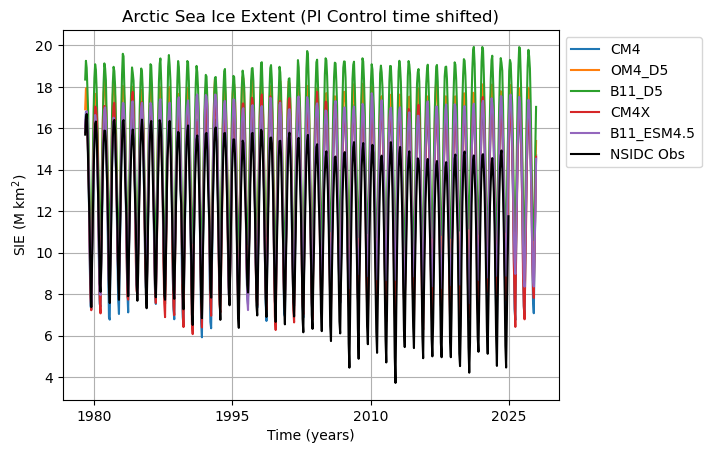

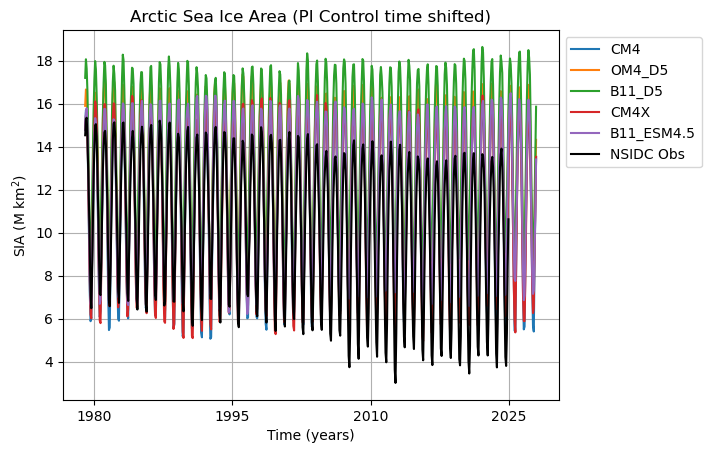

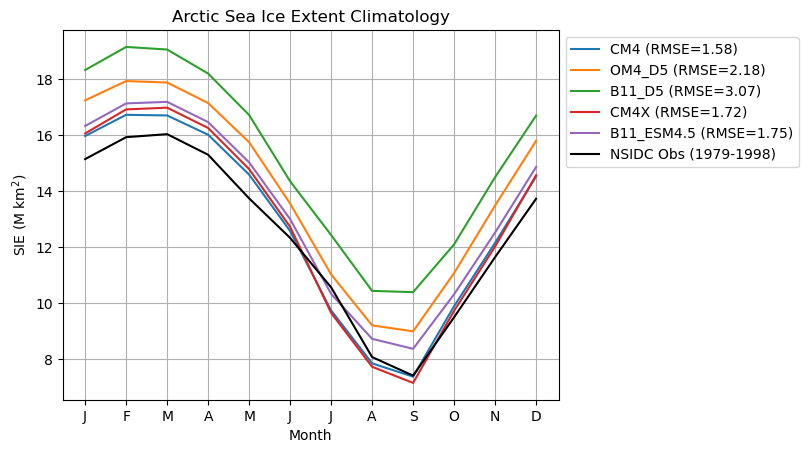

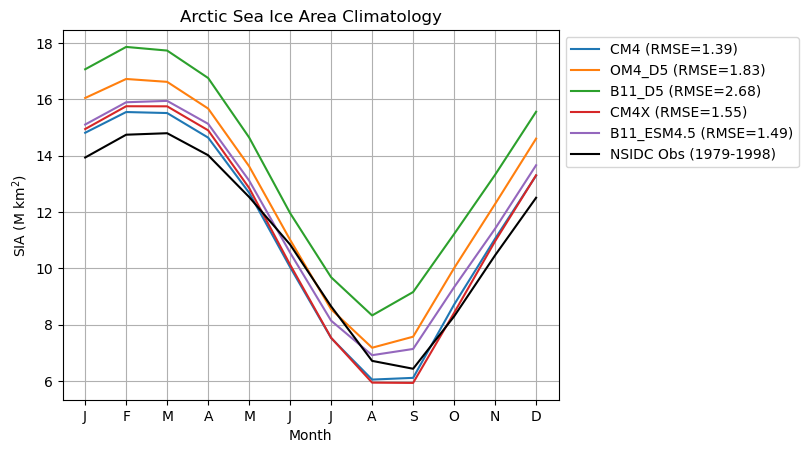

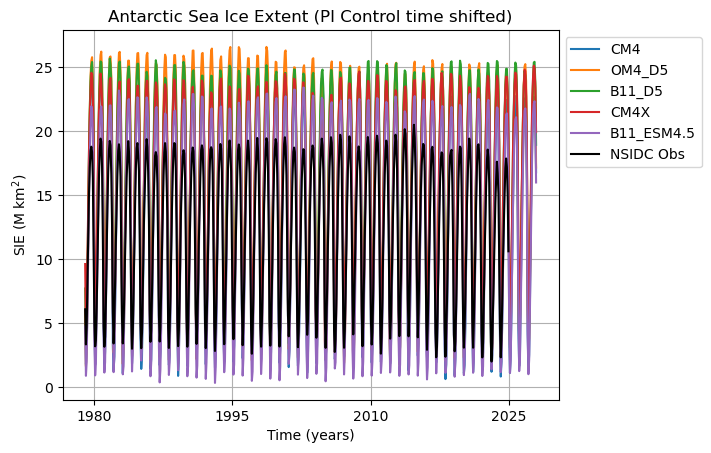

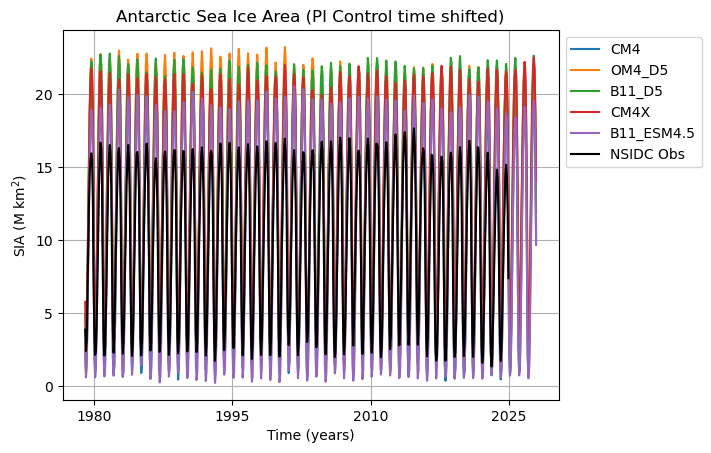

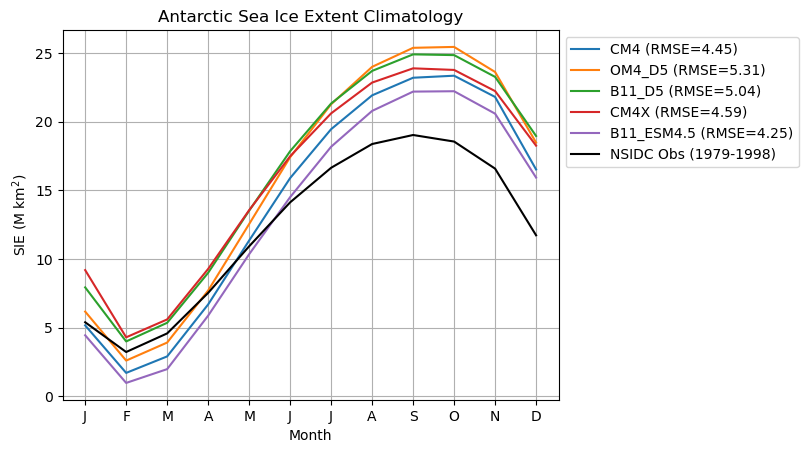

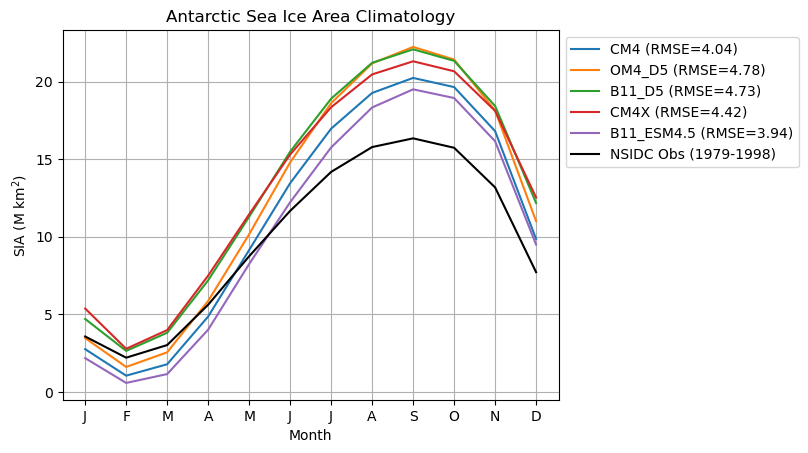

In [26]:
#SIE/SIA full timeseries

month_str_short=["J", "F", "M", "A", "M", "J", "J", "A", "S", "O", "N", "D"]
month_str=["Jan", "Feb", "Mar", "Apr", "May", "June", "July", "Aug", "Sep", "Oct", "Nov", "Dec"]

for hem in hem_list:
    idx = hem_list.index(hem)
    fig = plt.figure()
    for group in diag.groups:
        plt.plot(si_dict[group.name][hem]['time_shift'],si_dict[group.name][hem]['SIE'],label=group.name)
        plt.xlabel("Time (years)");plt.ylabel("SIE (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Extent (PI Control time shifted)")
    plt.plot(obs_ds[hem]["time"],obs_ds[hem]["extent"],color='k',label="NSIDC Obs")
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)
    
    fig = plt.figure()
    for group in diag.groups:
        plt.plot(si_dict[group.name][hem]['time_shift'],si_dict[group.name][hem]['SIA'],label=group.name)
        plt.xlabel("Time (years)");plt.ylabel("SIA (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Area (PI Control time shifted)")
    plt.plot(obs_ds[hem]["time"],obs_ds[hem]["area"],color='k',label="NSIDC Obs")
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)
    
    fig = plt.figure()
    for group in diag.groups:
        RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIE_clim'],obs_ds[hem]["extent_clim_PI"])
        plt.plot(np.arange(1, 13),si_dict[group.name][hem]['SIE_clim'],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
        group.add_metric(f"SIE_clim_RMSE_{hem}",("RMSE",RMS_tmp))
    plt.xlabel("Month");plt.ylabel("SIE (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Extent Climatology")
    plt.plot(np.arange(1, 13),obs_ds[hem]["extent_clim_PI"],color='k',label="NSIDC Obs (1979-1998)")
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.xticks(ticks=np.arange(1, 13), labels=month_str_short)
    all_figs.append(fig)
    
    fig = plt.figure()
    for group in diag.groups:
        RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIA_clim'],obs_ds[hem]["area_clim_PI"])
        plt.plot(np.arange(1, 13),si_dict[group.name][hem]['SIA_clim'],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
        group.add_metric(f"SIA_clim_RMSE_{hem}",("RMSE",RMS_tmp))
    plt.xlabel("Month");plt.ylabel("SIA (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Area Climatology")
    plt.plot(np.arange(1, 13),obs_ds[hem]["area_clim_PI"],color='k',label="NSIDC Obs (1979-1998)")
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.xticks(ticks=np.arange(1, 13), labels=month_str_short)
    all_figs.append(fig)    

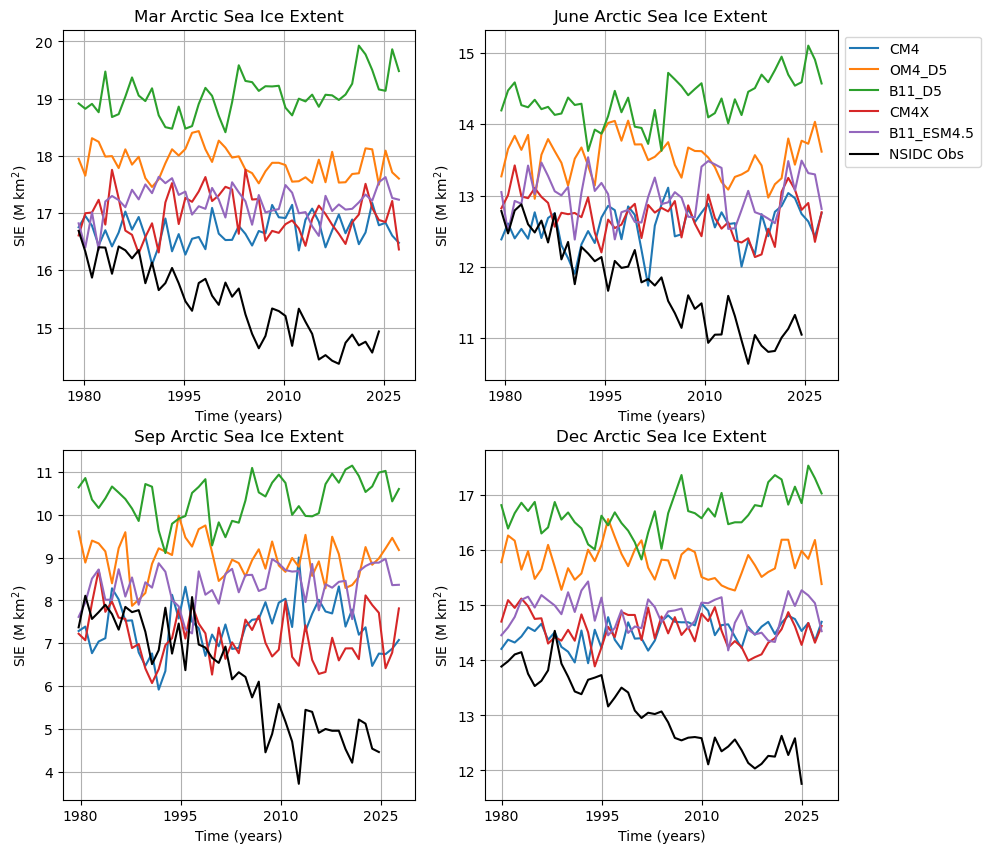

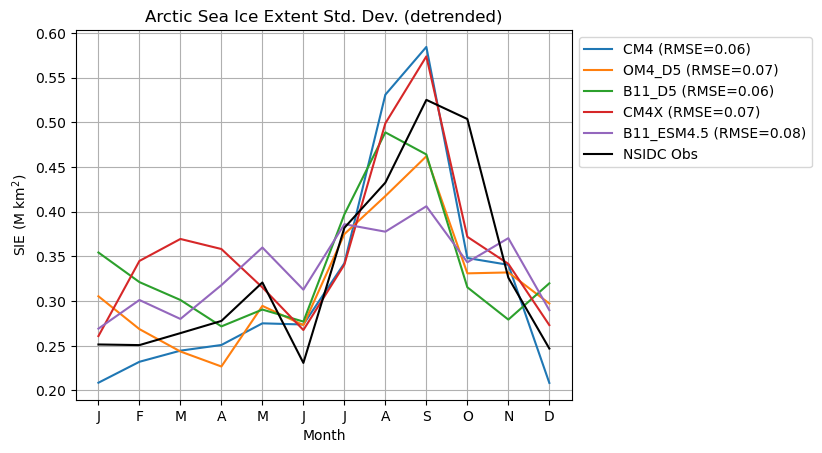

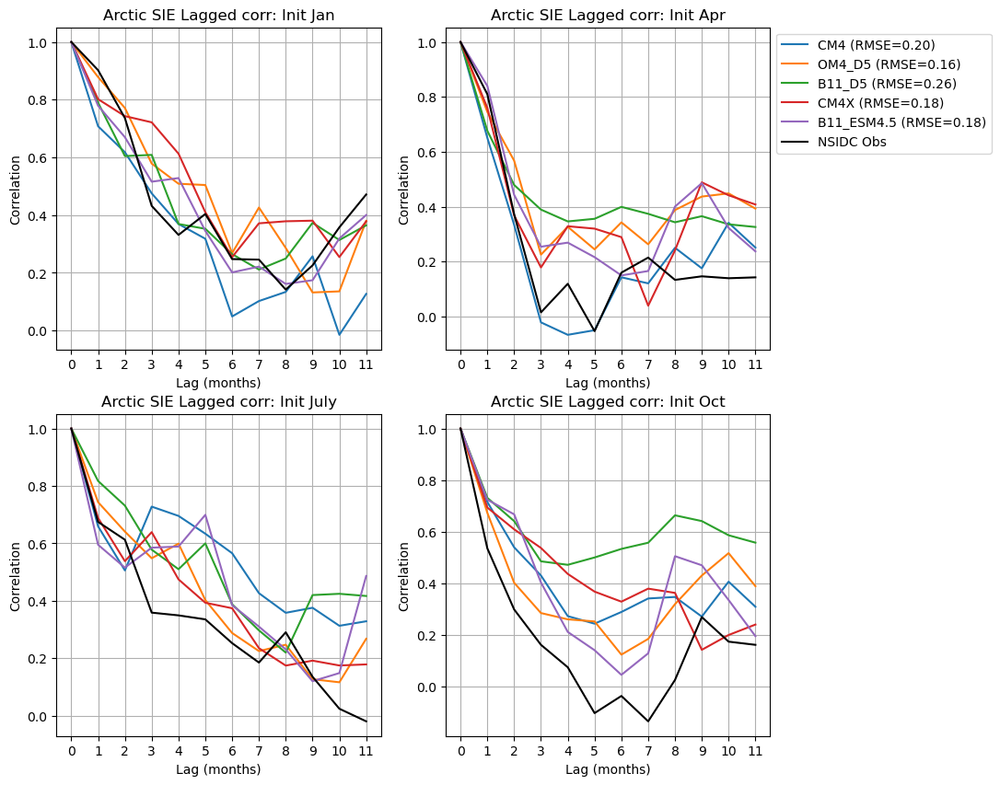

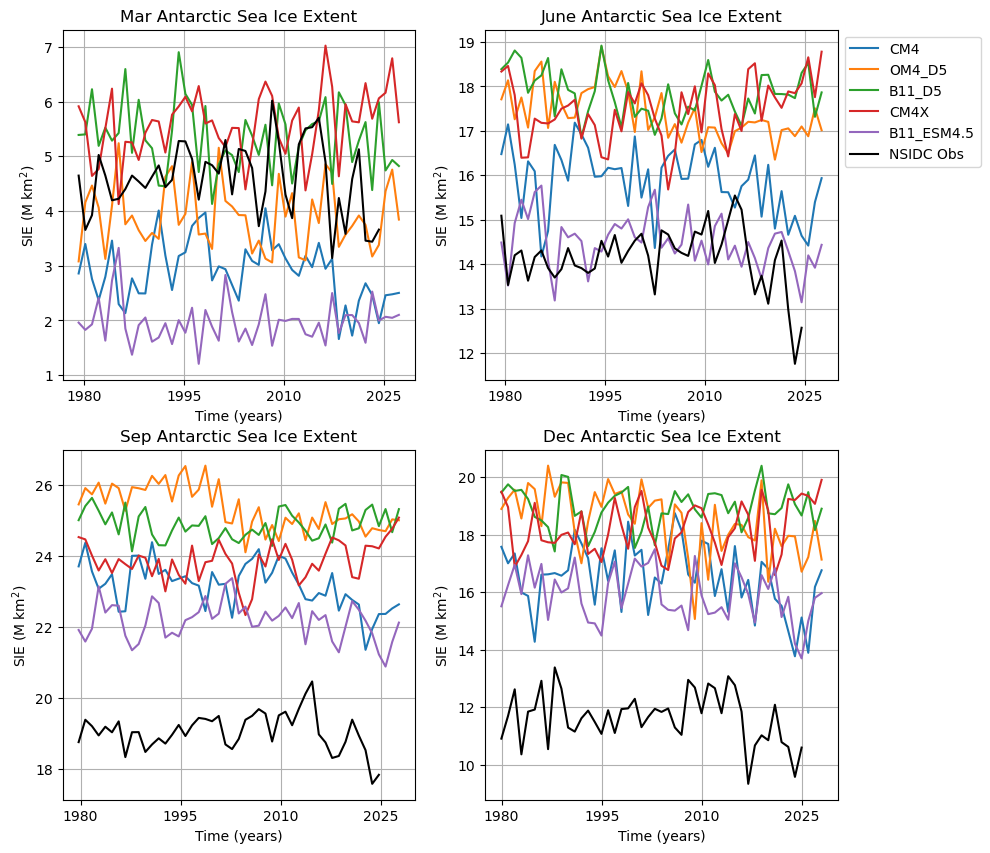

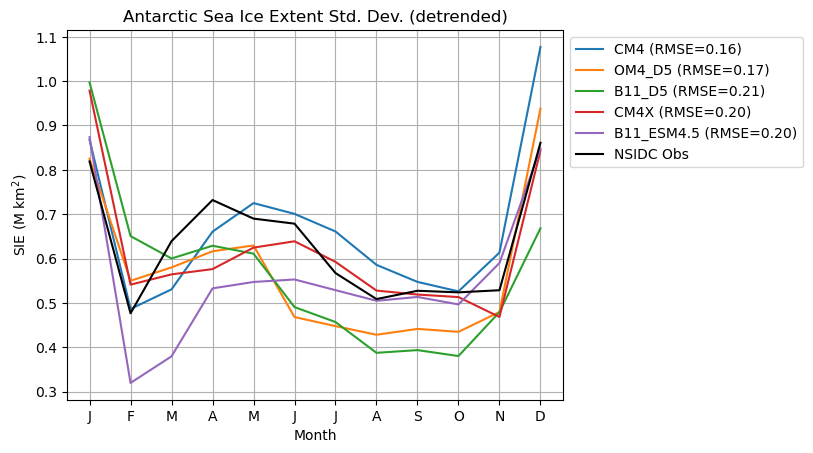

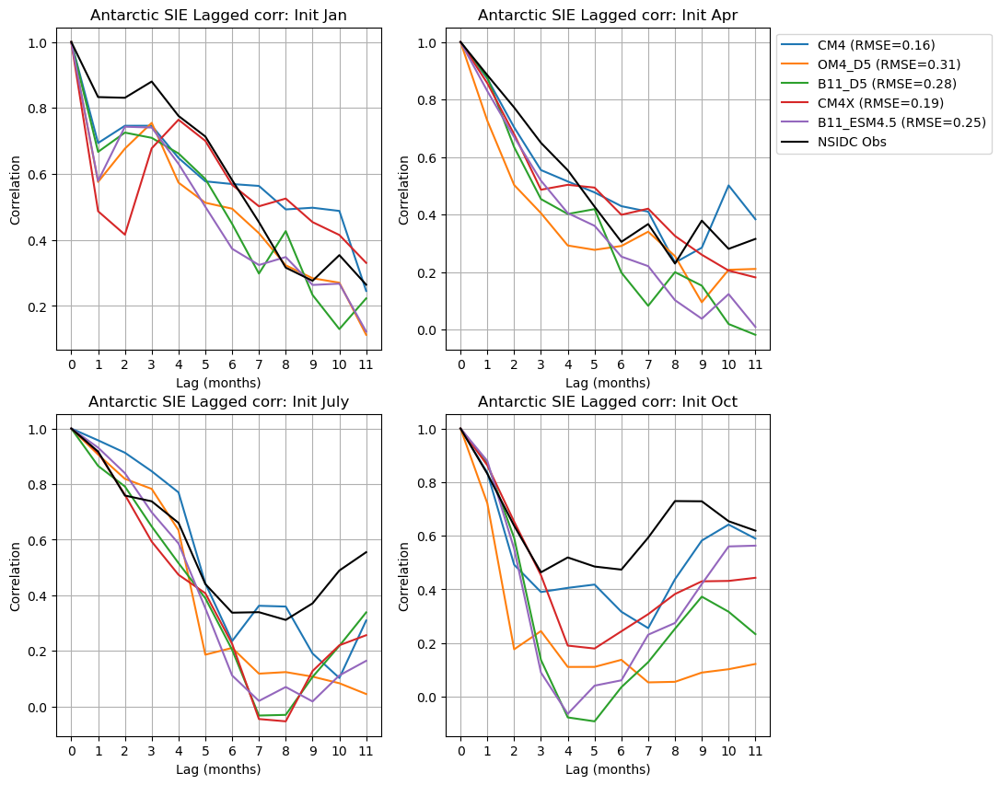

In [27]:
#SIE/SIA monthly timeseries

for hem in hem_list:
    idx = hem_list.index(hem)

    month_list=[2,5,8,11]
    fig, ax = plt.subplots(2,2,figsize=(10, 10))
    ax = ax.flatten()
    
    for i, month in enumerate(month_list):
        for group in diag.groups:
    
            ax[i].plot(si_dict[group.name][hem]['time_shift'][month::12],si_dict[group.name][hem]['SIE'][month::12],label=group.name)
            ax[i].set_xlabel("Time (years)");ax[i].set_ylabel("SIE (M km$^2$)")
            ax[i].set_title(month_str[month]+" "+hem_name[idx]+" Sea Ice Extent")
    
        ax[i].plot(obs_ds[hem]["time"][month::12],obs_ds[hem]["extent"][month::12],color='k',label="NSIDC Obs")
        ax[i].grid()
    ax[1].legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)
    
    fig = plt.figure()
    for group in diag.groups:
        RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIE_std_detrend'],obs_ds[hem]['extent_std_detrend'])
        plt.plot(np.arange(1, 13),si_dict[group.name][hem]['SIE_std_detrend'],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
        group.add_metric(f"SIE_std_RMSE_{hem}",("RMSE",RMS_tmp))
    plt.xlabel("Month");plt.ylabel("SIE (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Extent Std. Dev. (detrended)")
    plt.plot(np.arange(1, 13),obs_ds[hem]['extent_std_detrend'],color='k',label="NSIDC Obs")
    plt.xticks(ticks=np.arange(1, 13), labels=month_str_short)
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig) 
    
    month_list=[0,3,6,9]
    fig, ax = plt.subplots(2,2,figsize=(10, 10))
    ax = ax.flatten()
    
    for i, month in enumerate(month_list):
        for group in diag.groups:
            RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIE_lagged_corr'],obs_ds[hem]['extent_lagged_corr'])
            ax[i].plot(lags,si_dict[group.name][hem]['SIE_lagged_corr'][month,:],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
            ax[i].set_xlabel("Lag (months)");ax[i].set_ylabel("Correlation")
            ax[i].set_title(hem_name[idx]+" SIE Lagged corr: Init "+month_str[month])
            group.add_metric(f"SIE_lagged_corr_RMSE_{hem}",("RMSE",RMS_tmp))
        ax[i].plot(lags,obs_ds[hem]["extent_lagged_corr"][month,:],color='k',label="NSIDC Obs")
        ax[i].grid(); ax[i].set_xticks(np.arange(0, 12), labels=lags)
    ax[1].legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)

## Sea Ice Volume

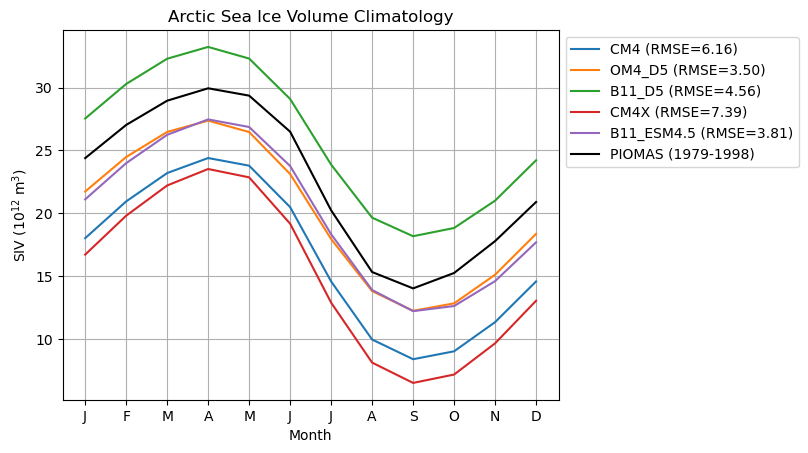

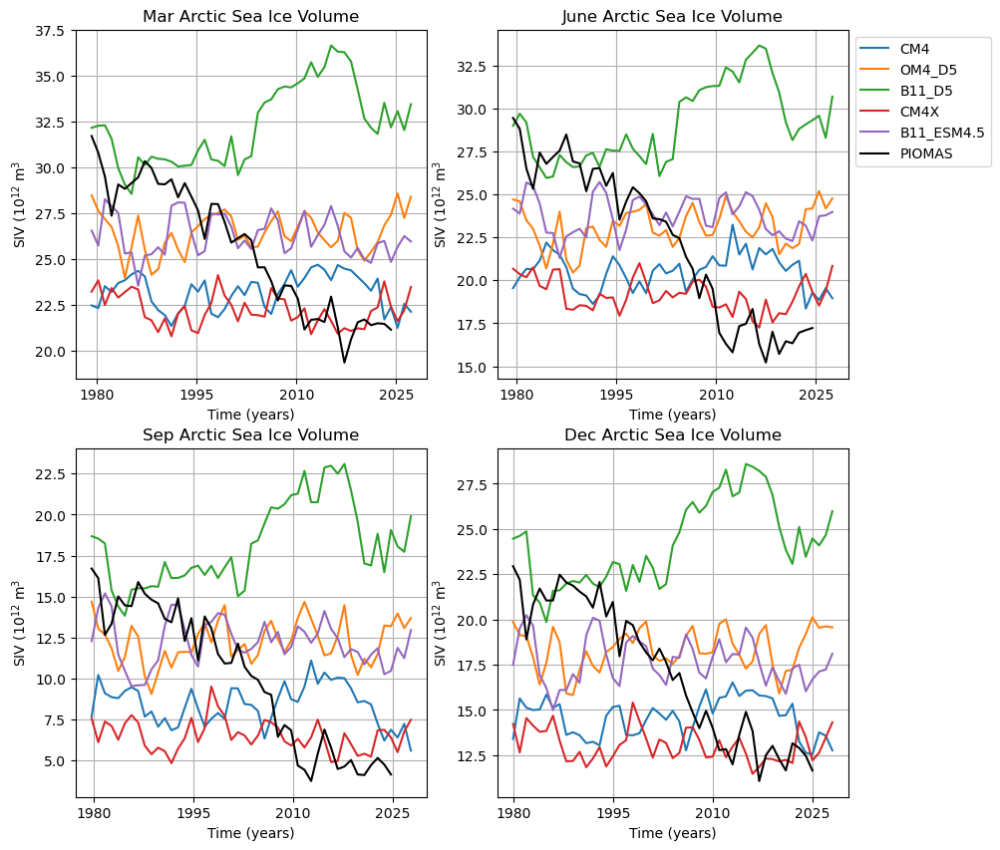

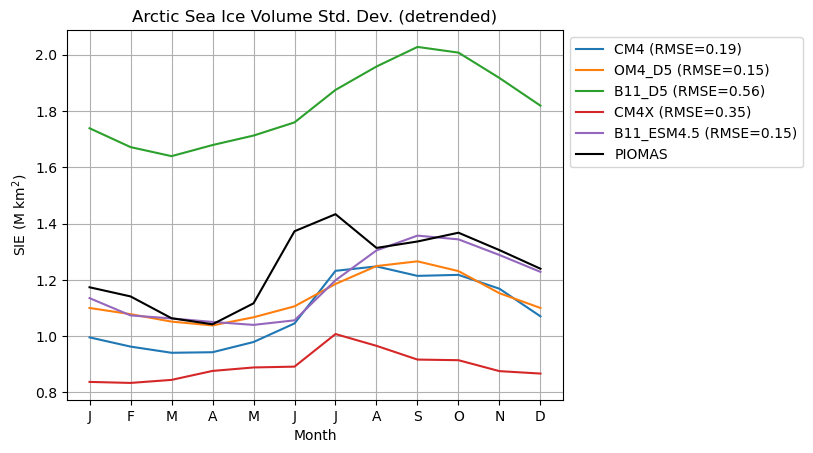

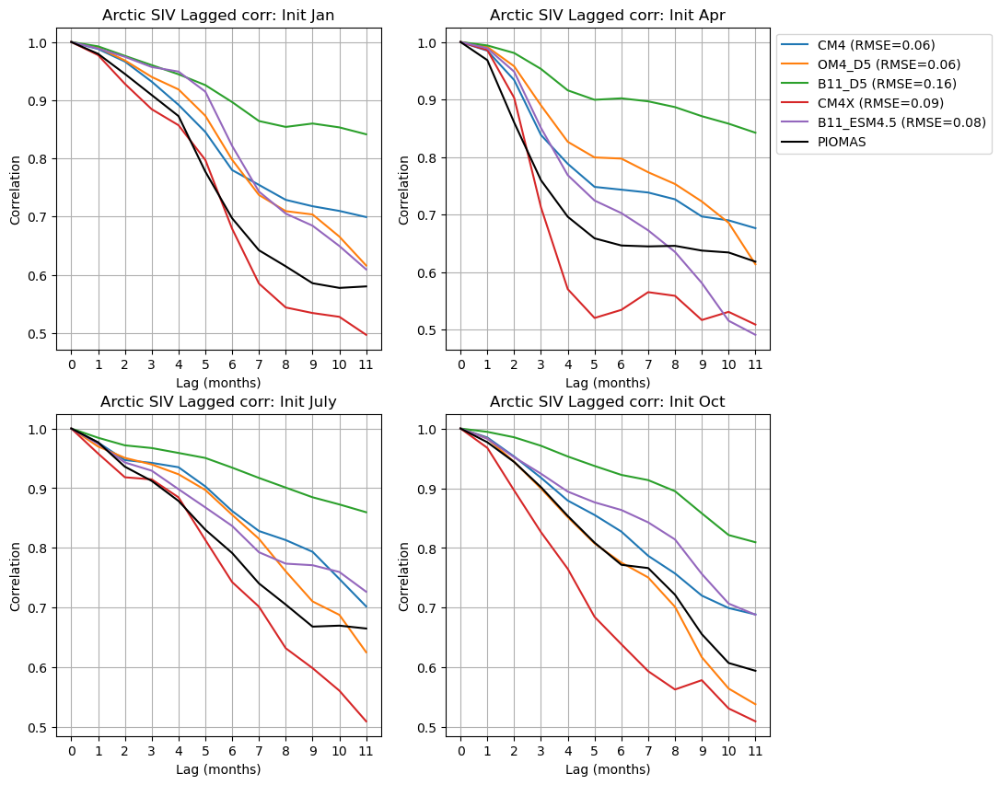

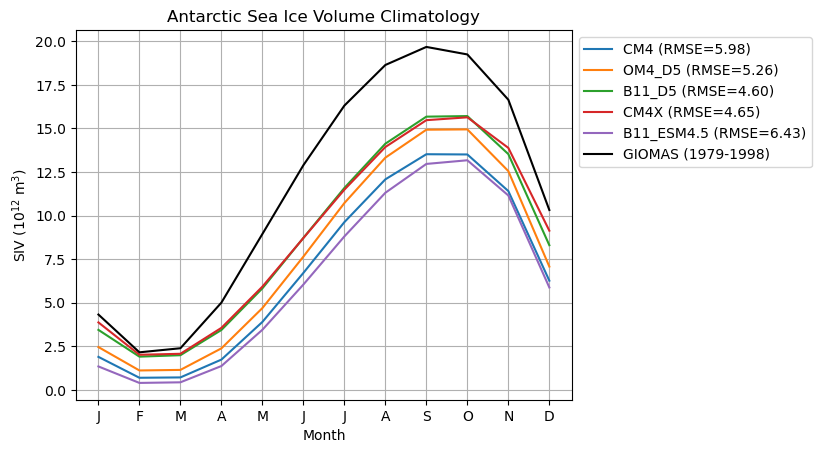

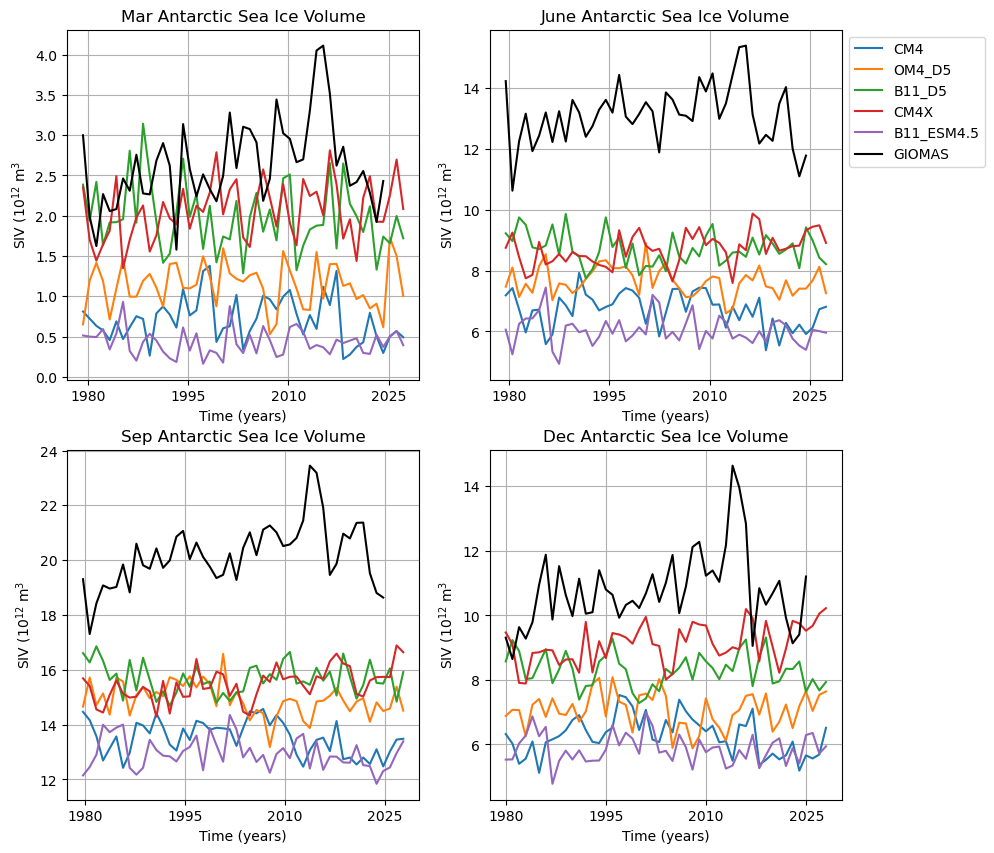

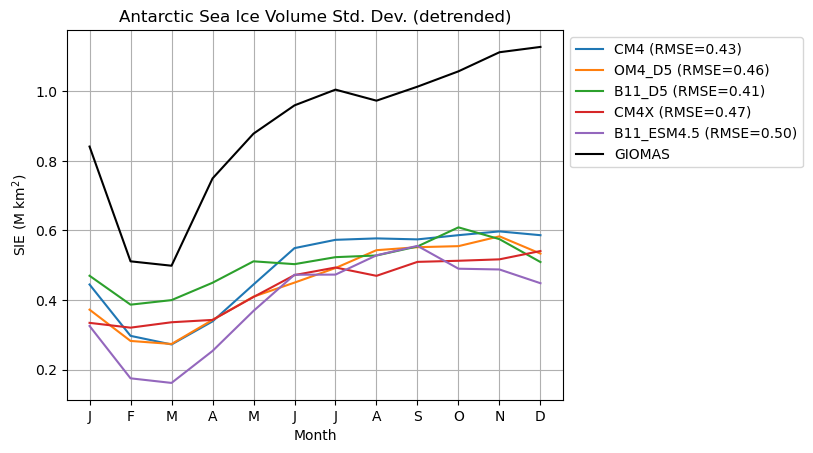

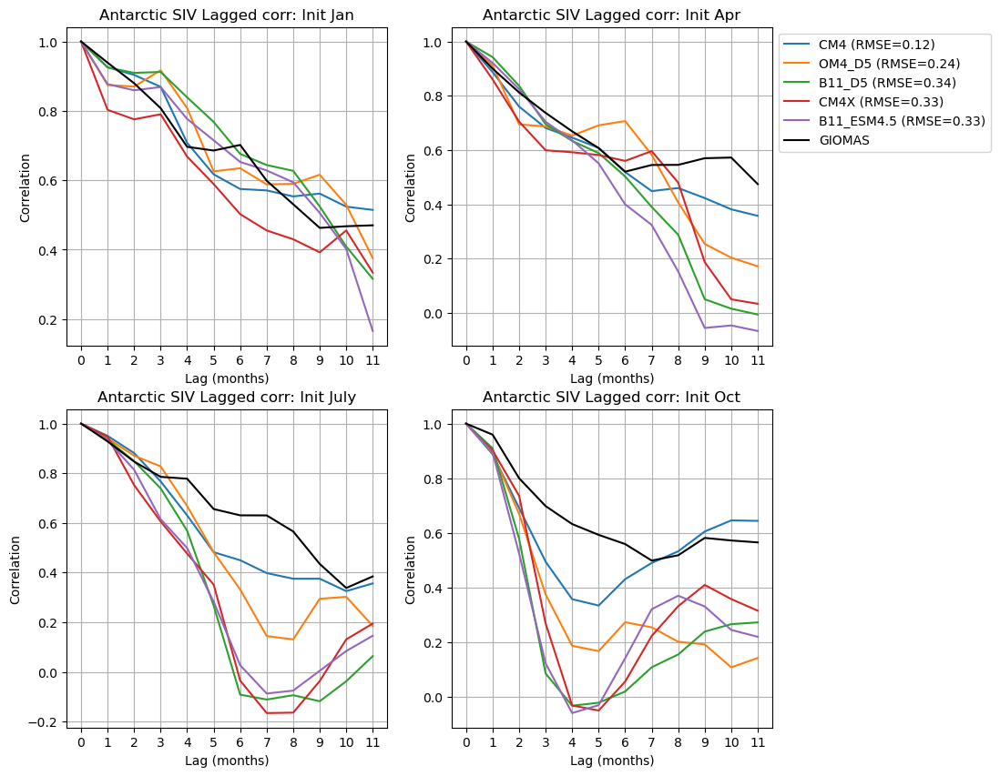

In [28]:
SIV_lbl={}
SIV_lbl['NH']='PIOMAS'
SIV_lbl['SH']='GIOMAS'

for hem in hem_list:
    idx = hem_list.index(hem)
    # plt.figure()
    # for group in diag.groups:
    #     plt.plot(si_dict[group.name][hem]['time_shift'],si_dict[group.name]['SIV'],label=group.name)
    #     plt.xlabel("Time (years)");plt.ylabel("SIV ($10^{12}$ m$^3$)");plt.title(hem_name[idx]+" Sea Ice Volume (PI Control time shifted)")
    # plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))

    #SIV clim
    fig = plt.figure()
    for group in diag.groups:
        RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIV_clim'],obs_ds[hem+"_SIT"]["volume_clim_PI"])
        plt.plot(np.arange(1, 13),si_dict[group.name][hem]['SIV_clim'],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
        group.add_metric(f"SIV_clim_RMSE_{hem}",("RMSE",RMS_tmp))
    plt.xlabel("Month");plt.ylabel("SIV ($10^{12}$ m$^3$)");plt.title(hem_name[idx]+" Sea Ice Volume Climatology")
    plt.plot(np.arange(1, 13),obs_ds[hem+"_SIT"]["volume_clim_PI"],color='k',label=SIV_lbl[hem]+" (1979-1998)")
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.xticks(ticks=np.arange(1, 13), labels=month_str_short)
    all_figs.append(fig)
    
    month_list=[2,5,8,11]
    fig, ax = plt.subplots(2,2,figsize=(10, 10))
    ax = ax.flatten()
    
    for i, month in enumerate(month_list):
        for group in diag.groups:
    
            ax[i].plot(si_dict[group.name][hem]['time_shift'][month::12],si_dict[group.name][hem]['SIV'][month::12],label=group.name)
            ax[i].set_xlabel("Time (years)");ax[i].set_ylabel("SIV ($10^{12}$ m$^3$")
            ax[i].set_title(month_str[month]+" "+hem_name[idx]+" Sea Ice Volume")
    
        ax[i].plot(obs_ds[hem+"_SIT"]["time"][month::12],obs_ds[hem+"_SIT"]["volume"][month::12],color='k',label=SIV_lbl[hem])
        ax[i].grid()
    ax[1].legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)
    
    fig = plt.figure()
    for group in diag.groups:
        RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIV_std_detrend'],obs_ds[hem+"_SIT"]['volume_std_detrend'])
        plt.plot(np.arange(1, 13),si_dict[group.name][hem]['SIV_std_detrend'],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
        group.add_metric(f"SIV_std_RMSE_{hem}",("RMSE",RMS_tmp))
    plt.xlabel("Month");plt.ylabel("SIE (M km$^2$)");plt.title(hem_name[idx]+" Sea Ice Volume Std. Dev. (detrended)")
    plt.plot(np.arange(1, 13),obs_ds[hem+"_SIT"]['volume_std_detrend'],color='k',label=SIV_lbl[hem])
    plt.xticks(ticks=np.arange(1, 13), labels=month_str_short)
    plt.grid();plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)
    
    month_list=[0,3,6,9]
    fig, ax = plt.subplots(2,2,figsize=(10, 10))
    ax = ax.flatten()
    
    for i, month in enumerate(month_list):
        for group in diag.groups:
            RMS_tmp=RMSE_timeseries(si_dict[group.name][hem]['SIV_lagged_corr'],obs_ds[hem+"_SIT"]["volume_lagged_corr"])
            ax[i].plot(lags,si_dict[group.name][hem]['SIV_lagged_corr'][month,:],label=f"{group.name} (RMSE={RMS_tmp:.2f})")
            ax[i].set_xlabel("Lag (months)");ax[i].set_ylabel("Correlation")
            ax[i].set_title(hem_name[idx]+" SIV Lagged corr: Init "+month_str[month])
            group.add_metric(f"SIV_lagged_corr_RMSE_{hem}",("RMSE",RMS_tmp))
        ax[i].plot(lags,obs_ds[hem+"_SIT"]["volume_lagged_corr"][month,:],color='k',label=SIV_lbl[hem])
        ax[i].grid(); ax[i].set_xticks(np.arange(0, 12), labels=lags)
    ax[1].legend(loc='upper left',bbox_to_anchor=(1,1))
    all_figs.append(fig)

## Sea Ice Concentration

In [29]:
len(diag.groups)

5

In [30]:
#compute spatial climatologies
for group in diag.groups:

    variable=diag.variables[idx_siconc]
    ds = group.datasets[variable]
    ds
    SIC_clim = ds["siconc"].groupby("time.month").mean(dim="time")
    SIC_std = ds["siconc"].groupby("time.month").std(dim="time")
    SIC_std_ann = ds["siconc"].std(dim="time")
    
    variable=diag.variables[idx_sithick]
    ds = group.datasets[variable]
    SIT_clim = ds["sithick"].groupby("time.month").mean(dim="time")

    variable=diag.variables[idx_LSRC]
    ds = group.datasets[variable]
    LSRC_clim = ds["LSRC"].groupby("time.month").mean(dim="time")
    LSRC_clim_ann_mean = ds["LSRC"].mean(dim="time")
    
    variable=diag.variables[idx_LSNK]
    ds = group.datasets[variable]
    LSNK_clim = ds["LSNK"].groupby("time.month").mean(dim="time")
    LSNK_clim_ann_mean = ds["LSNK"].mean(dim="time")

    variable=diag.variables[idx_XPRT]
    ds = group.datasets[variable]
    XPRT_clim = ds["XPRT"].groupby("time.month").mean(dim="time")
    XPRT_clim_ann_mean = ds["XPRT"].mean(dim="time")
    
    si_dict[group.name]['SIC_clim']=SIC_clim
    si_dict[group.name]['SIC_std']=SIC_std
    si_dict[group.name]['SIC_std_ann']=SIC_std_ann
    si_dict[group.name]['SIT_clim']=SIT_clim
    si_dict[group.name]['LSRC_clim']=LSRC_clim
    si_dict[group.name]['LSRC_clim_ann_mean']=LSRC_clim_ann_mean
    si_dict[group.name]['LSNK_clim']=LSNK_clim
    si_dict[group.name]['LSNK_clim_ann_mean']=LSNK_clim_ann_mean
    si_dict[group.name]['XPRT_clim']=XPRT_clim
    si_dict[group.name]['XPRT_clim_ann_mean']=XPRT_clim_ann_mean
    si_dict[group.name][lonvar]=ds[lonvar]
    si_dict[group.name][latvar]=ds[latvar]
    si_dict[group.name]['wet']=ds['wet']
    si_dict[group.name][areavar]=ds[areavar]

In [31]:
#regrid SIC obs data onto the model grids

#NH
print("Obs Dims")
print(obs_ds['NH']['SIC_clim_PI'].shape)
print(obs_ds['NH']['x'].shape)
print(obs_ds['NH']['y'].shape)

wet_mask= obs_ds['NH']['area_weights'] > 0

grid_in = {"lon": obs_ds['NH']['x'], "lat": obs_ds['NH']['y'], "mask": wet_mask}

#plt.imshow(obs_ds['NH']['area_weights'][:,:], vmin=0, vmax=1, cmap='viridis')
#plt.imshow(wet_mask, vmin=0, vmax=1, cmap='viridis')
#plt.colorbar(label="Value")

for group in diag.groups:
    print(group.name)
    print(si_dict[group.name][lonvar].shape)
    print(si_dict[group.name][latvar].shape)
    grid_out = {"lon": si_dict[group.name][lonvar], "lat": si_dict[group.name][latvar], "mask": si_dict[group.name]['wet']}

    print(si_dict[group.name][lonvar].values.max())
    print(obs_ds['NH']['x'].values.max())
    
    print("Computing weights...")
    ##regridder  = xesmf.Regridder(grid_in, grid_out, method="bilinear", extrap_method="nearest_s2d", periodic=True)
    #regridder  = xesmf.Regridder(grid_in, grid_out, method="bilinear", extrap_method="inverse_dist", periodic=True)
    regridder  = xesmf.Regridder(grid_in, grid_out, method="nearest_s2d", periodic=True)
    print("Regridding...")
    si_dict[group.name]['SIC_clim_PI_obs_NH'] = regridder(obs_ds['NH']['SIC_clim_PI'])

#SH
print("Obs Dims")
print(obs_ds['SH']['SIC_clim_PI'].shape)
print(obs_ds['SH']['x'].shape)
print(obs_ds['SH']['y'].shape)

wet_mask= obs_ds['SH']['area_weights'] > 0

grid_in = {"lon": obs_ds['SH']['x'], "lat": obs_ds['SH']['y'], "mask": wet_mask}

#plt.imshow(obs_ds['NH']['area_weights'][:,:], vmin=0, vmax=1, cmap='viridis')
#plt.imshow(wet_mask, vmin=0, vmax=1, cmap='viridis')
#plt.colorbar(label="Value")

for group in diag.groups:
    print(group.name)
    print(si_dict[group.name][lonvar].shape)
    print(si_dict[group.name][latvar].shape)
    grid_out = {"lon": si_dict[group.name][lonvar], "lat": si_dict[group.name][latvar], "mask": si_dict[group.name]['wet']}

    print(si_dict[group.name][lonvar].values.min())
    print(obs_ds['SH']['x'].values.min())
    
    print("Computing weights...")
    #regridder  = xesmf.Regridder(grid_in, grid_out, method="bilinear", periodic=True)
    regridder  = xesmf.Regridder(grid_in, grid_out, method="nearest_s2d", periodic=True)
    #regridder  = xesmf.Regridder(grid_in, grid_out, method="bilinear", extrap_method="nearest_s2d", periodic=True)
    #regridder  = xesmf.Regridder(grid_in, grid_out, method="bilinear", extrap_method="inverse_dist", periodic=True)
    print("Regridding...")
    si_dict[group.name]['SIC_clim_PI_obs_SH'] = regridder(obs_ds['SH']['SIC_clim_PI'])


Obs Dims
(448, 304, 12)
(448, 304)
(448, 304)
CM4
(1080, 1440)
(1080, 1440)
359.9992
179.81398
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


OM4_D5
(1080, 1440)
(1080, 1440)
359.9992
179.81398
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


B11_D5
(1161, 1440)
(1161, 1440)
359.9992
179.81398
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


CM4X
(2240, 2880)
(2240, 2880)
359.99997
179.81398
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


B11_ESM4.5
(1161, 1440)
(1161, 1440)
359.9992
179.81398
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


Obs Dims
(332, 316, 12)
(332, 316)
(332, 316)
CM4
(1080, 1440)
(1080, 1440)
0.00043659194
0.16512
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


OM4_D5
(1080, 1440)
(1080, 1440)
0.00043659194
0.16512
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


B11_D5
(1161, 1440)
(1161, 1440)
0.00043659194
0.16512
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


CM4X
(2240, 2880)
(2240, 2880)
0.0007527542
0.16512
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


B11_ESM4.5
(1161, 1440)
(1161, 1440)
0.00043659194
0.16512
Computing weights...
Regridding...


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/xesmf/smm.py:131: UserWarning: Input array is not C_CONTIGUOUS. Will affect performance.
  warnings.warn('Input array is not C_CONTIGUOUS. ' 'Will affect performance.')


In [32]:
# for group in diag.groups:
#     print(group.name)
#     for month in range(0,12):
#     #for month in range(0,1):
#         # fig, ax = plt.subplots(1,2,figsize=(16, 8),subplot_kw={'projection': ccrs.NorthPolarStereo()})
#         # make_polar_plot_nh(ax[0],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name]['SIC_clim_PI_obs_NH'][month,:,:],
#         # 6,6,60,0,1,0.05,"Regrid "+month_str[month],"",1)
#         # make_polar_plot_nh(ax[1],obs_ds['NH']['x'],obs_ds['NH']['y'],obs_ds['NH']['SIC_clim_PI'][:,:,month],
#         # 6,6,60,0,1,0.05,"Obs "+month_str[month],"",1)
#         plt.pause(0.001)
#         fig, ax = plt.subplots(1,2,figsize=(16, 8),subplot_kw={'projection': ccrs.SouthPolarStereo()})
#         make_polar_plot_sh(ax[0],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name]['SIC_clim_PI_obs_SH'][month,:,:],
#         6,6,60,0,1,0.05,"Regrid "+month_str[month],"",1)
#         #make_polar_plot_sh(ax[0],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name]['SIC_clim_PI_obs_SH'],
#         #6,6,60,0,360,10,"Regrid "+month_str[month],"",1)
#         make_polar_plot_sh(ax[1],obs_ds['SH']['x'],obs_ds['SH']['y'],obs_ds['SH']['SIC_clim_PI'][:,:,month],
#         6,6,60,0,1,0.05,"Obs "+month_str[month],"",1)
#         #make_polar_plot_sh(ax[1],obs_ds['SH']['x'],obs_ds['SH']['y'],obs_ds['SH']['x'],
#         #6,6,60,0,360,10,"Obs "+month_str[month],"",1)
#         plt.pause(0.001)

In [33]:
def make_polar_plot_nh(ax,x,y,data,fig_x,fig_y,radius,cmin,cmax,deltac,title_str,text_str,iscbar):
    cmap, norm, boundaries = gen_levs_and_cmap(cmin,cmax+deltac,deltac)
    cmap.set_bad(color='lightgray')    
    #fig, ax = plt.subplots(1,1,figsize=(fig_x, fig_y),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    ax.set_extent([-180, 180, 90-radius, 90], ccrs.PlateCarree())    
    cb=ax.pcolormesh(x,y,data,transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
    ax.coastlines()
    ax.set_title(title_str)
    #ax.text(226, 38, text_str, fontsize=10, color='white',transform=ccrs.PlateCarree())
    ax.text(-0.1,0.1,text_str, fontsize=10, color='black', rotation=90, transform=ax.transAxes)
    if iscbar==1:
        add_colorbar(fig, cb, boundaries)

In [34]:
def make_polar_plot_sh(ax,x,y,data,fig_x,fig_y,radius,cmin,cmax,deltac,title_str,text_str,iscbar):
    cmap, norm, boundaries = gen_levs_and_cmap(cmin,cmax+deltac,deltac)
    cmap.set_bad(color='lightgray')    
    #fig, ax = plt.subplots(1,1,figsize=(fig_x, fig_y),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    ax.set_extent([-180, 180, -90, -90+radius], ccrs.PlateCarree())    
    cb=ax.pcolormesh(x,y,data,transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
    ax.coastlines()
    ax.set_title(title_str)
    #ax.text(270, -80, text_str, fontsize=10, color='white',transform=ccrs.PlateCarree())
    ax.text(-0.1,0.1,text_str, fontsize=10, color='black', rotation=90, transform=ax.transAxes)
    if iscbar==1:
        add_colorbar(fig, cb, boundaries)

0
RMSE:0.23486832789309753
RMSE:0.1917901800914781
RMSE:0.11525750733646067
RMSE:0.19598653165213906
1
RMSE:0.2675200885401244
RMSE:0.22255709985202674
RMSE:0.18351690678550542
RMSE:0.2620476725370503
2
RMSE:0.2971998060500818


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.23780001062148778


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.26422096156990904


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2960796386702566


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


3
RMSE:0.22271303614808263
RMSE:0.18190970932689612
RMSE:0.11883774364375668
RMSE:0.17709799306920654
4
RMSE:0.20655800623764137


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.17458986588926742


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.14137717421209847


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.1860793159954816


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


0
RMSE:0.13621467843896348


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.13791598066463914


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2555636094992127


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.17848493180247393


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


1
RMSE:0.12297342598766213


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.20416516486221592


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.32851486927721285


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2168644019167503


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


2
RMSE:0.15557264323606557


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.23854535864431275


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.31874186271841126


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.25355149531872223


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


3
RMSE:0.12527384728782154


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2112006090463702


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2753667345417777


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.2586492238954848


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


4
RMSE:0.17550984800006425


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.1265522331886137


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.22292902879534465


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


RMSE:0.16904081522747433


/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


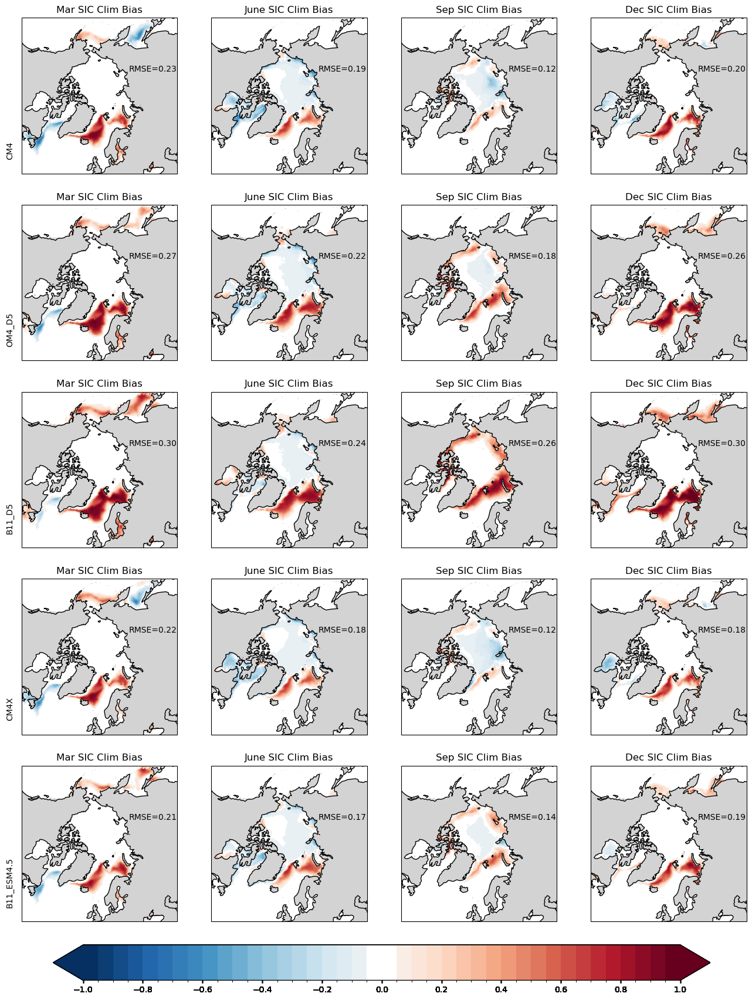

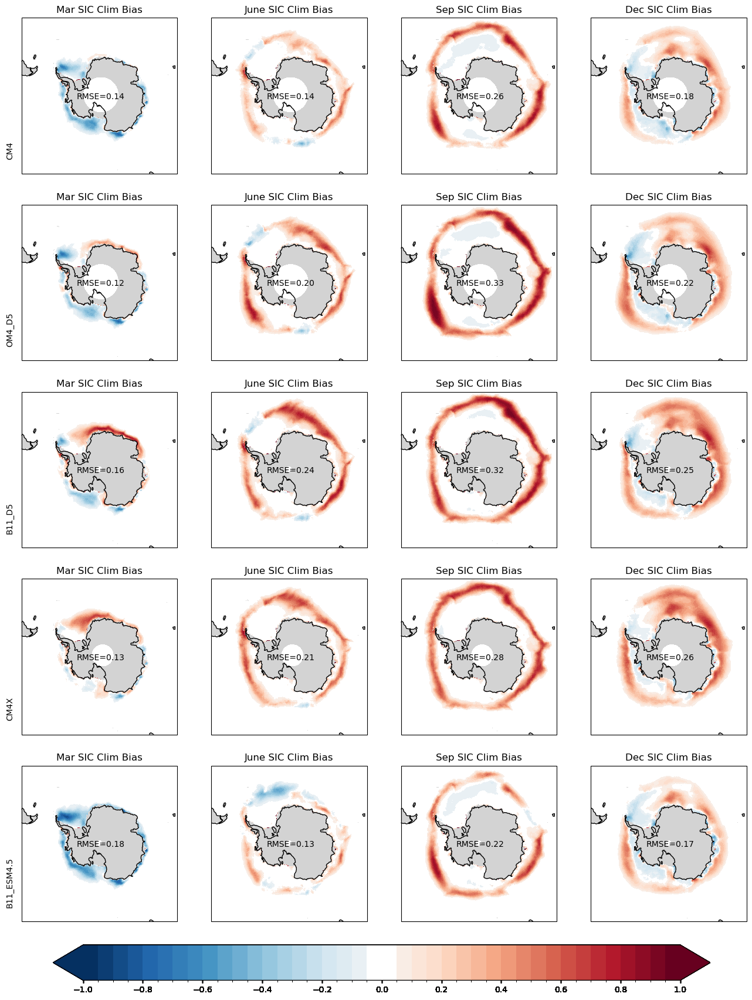

In [35]:
#make plot of siconc biases
month_list=[2,5,8,11]
M=len(month_list)

fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.NorthPolarStereo()})    
    
for k,group in enumerate(diag.groups):
    print(k)
    for i, month in enumerate(month_list):
        #compute RMSE over SIC variance mask
        var_mask= ((si_dict[group.name]['SIC_std_ann']>0.01) & (si_dict[group.name][latvar] > 0))
        weights=si_dict[group.name][areavar].where(var_mask)
        RMS_tmp=RMSE_spatial(si_dict[group.name]['SIC_clim'][month,:,:],si_dict[group.name]['SIC_clim_PI_obs_NH'][month,:,:],weights.fillna(0))
        print("RMSE:"+str(RMS_tmp))
        #hem_mask = mask.loc[hem]
        #print(hem_mask.shape)
        title_str=month_str[month]+" SIC Clim Bias"
        text_str = group.name if i == 0 else ''
        make_polar_plot_nh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name]['SIC_clim'][month,:,:]-si_dict[group.name]['SIC_clim_PI_obs_NH'][month,:,:],
        6,6,40,-1,1,0.05,title_str,text_str,1)
        ax[k,i].text(130, 70, f"RMSE={RMS_tmp:.2f}", fontsize=10, color='black',transform=ccrs.PlateCarree())
        group.add_metric(f"SIC_clim_RMSE_{month}_NH",("RMSE",RMS_tmp))
all_figs.append(fig)

fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.SouthPolarStereo()})

for k,group in enumerate(diag.groups):
    print(k)
    for i, month in enumerate(month_list):
        #compute RMSE over SIC variance mask
        var_mask= ((si_dict[group.name]['SIC_std_ann']>0.01) & (si_dict[group.name][latvar] < 0))
        weights=si_dict[group.name][areavar].where(var_mask)
        RMS_tmp=RMSE_spatial(si_dict[group.name]['SIC_clim'][month,:,:],si_dict[group.name]['SIC_clim_PI_obs_SH'][month,:,:],weights.fillna(0))
        print("RMSE:"+str(RMS_tmp))
        title_str=month_str[month]+" SIC Clim Bias"
        text_str = group.name if i == 0 else ''
        make_polar_plot_sh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name]['SIC_clim'][month,:,:]-si_dict[group.name]['SIC_clim_PI_obs_SH'][month,:,:],
    6,6,40,-1,1,0.05,title_str,text_str,1)
        ax[k,i].text(260, -78, f"RMSE={RMS_tmp:.2f}", fontsize=10, color='black',transform=ccrs.PlateCarree())
        group.add_metric(f"SIC_clim_RMSE_{month}_SH",("RMSE",RMS_tmp))
all_figs.append(fig)

## Spatial Maps

/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
 

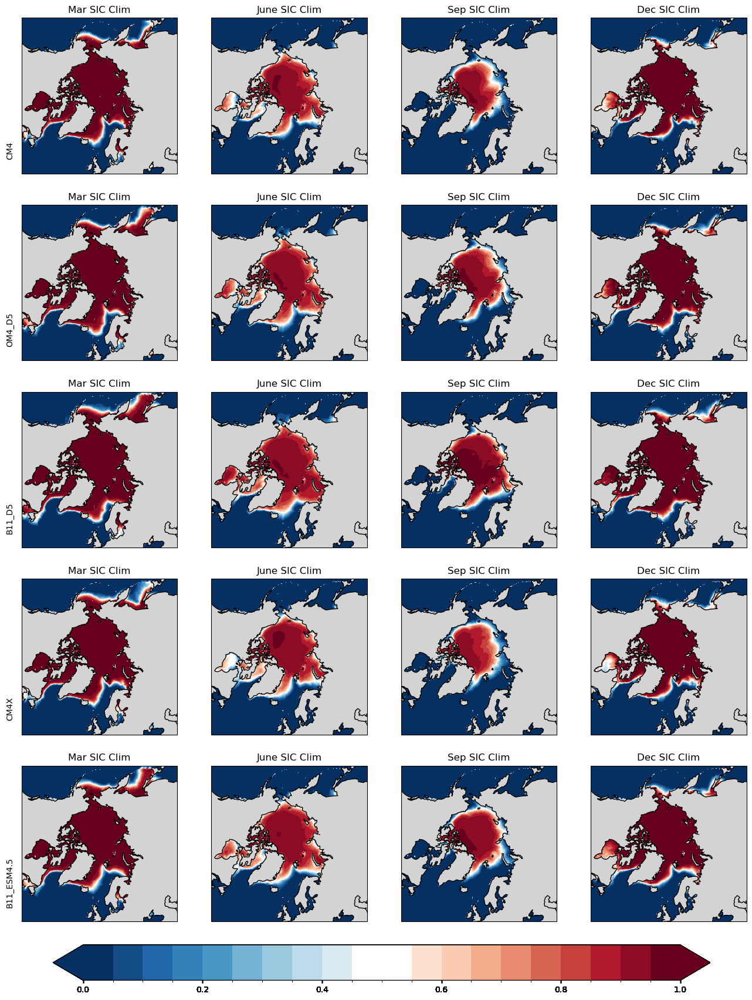

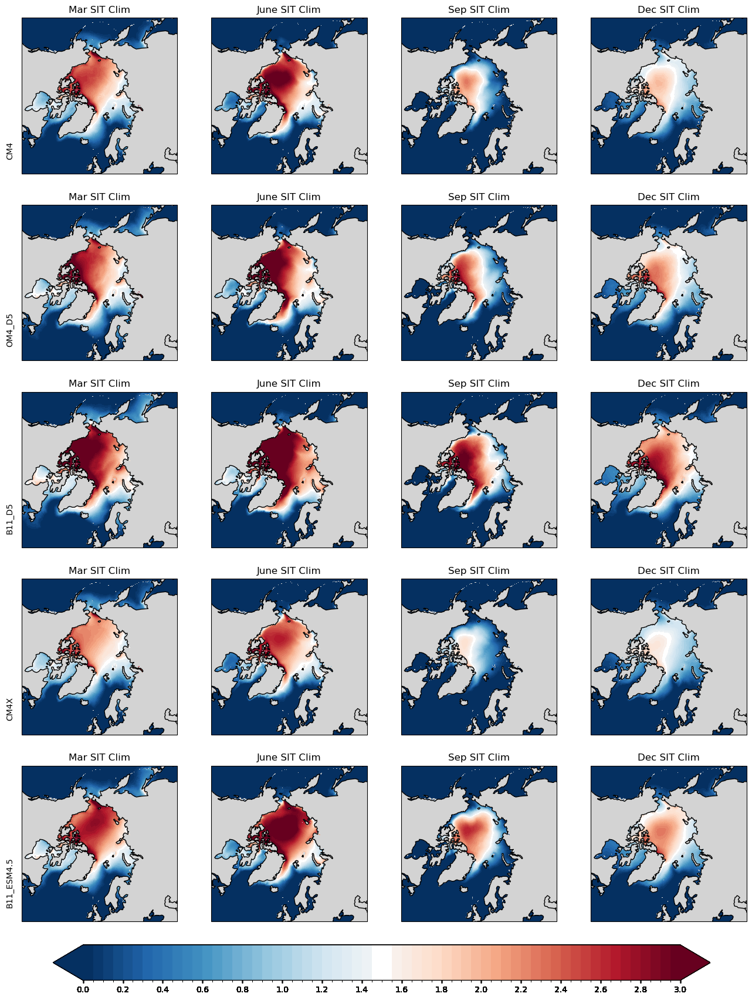

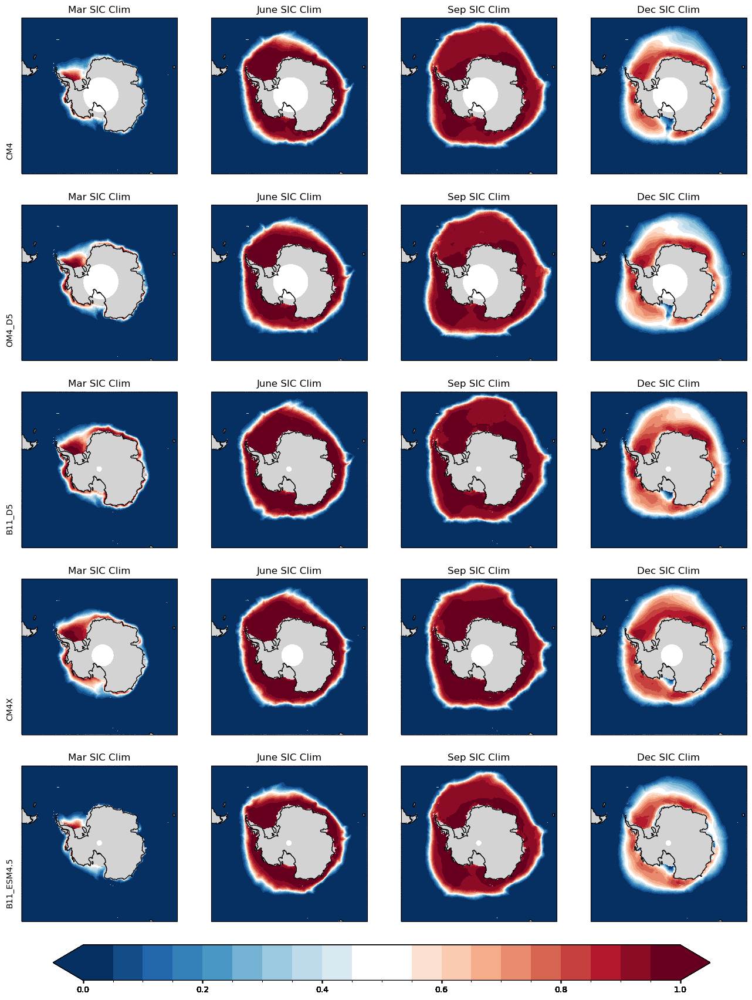

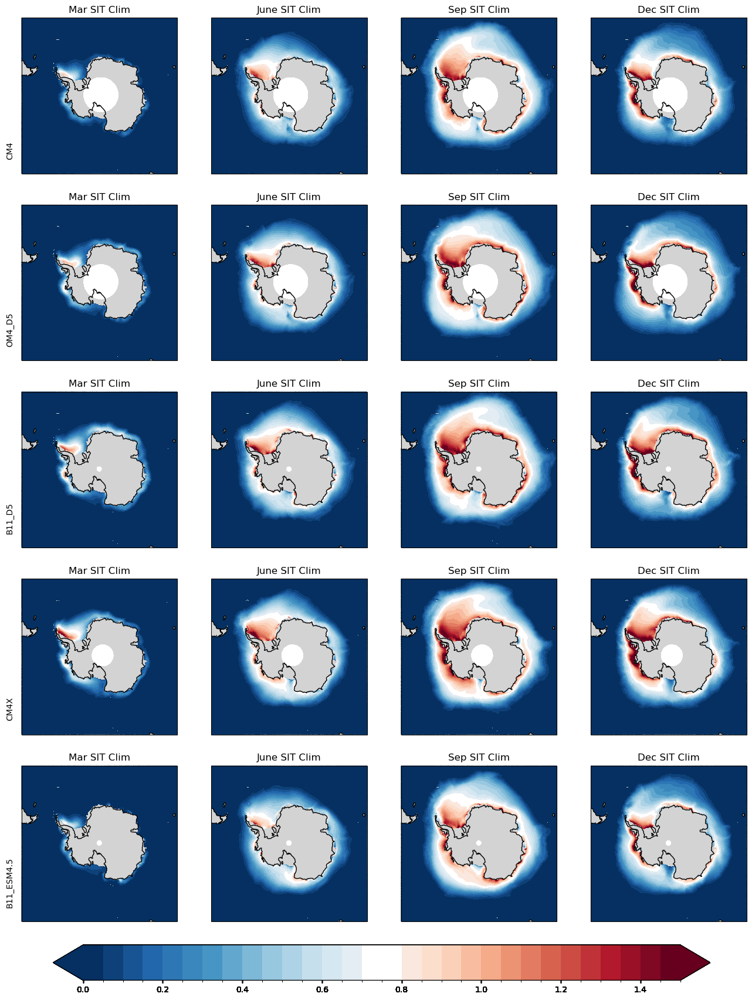

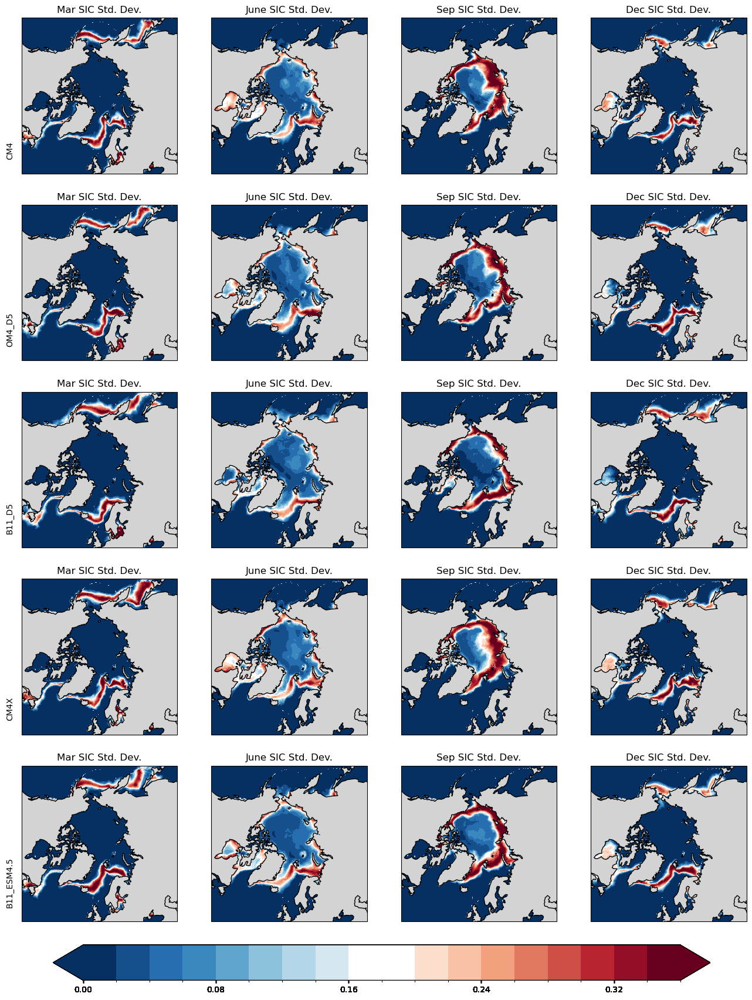

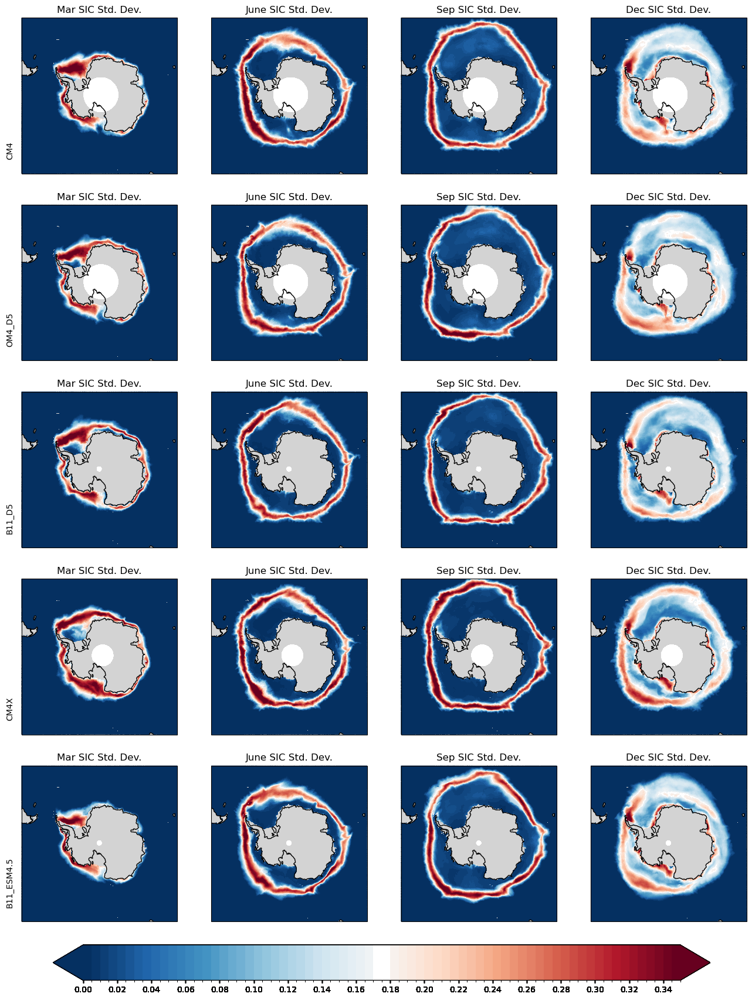

In [36]:
##Climatological spatial maps
var_list=['SIC','SIT']

month_list=[2,5,8,11]
M=len(month_list)  
c_lims_nh=np.array([
 [0, 1],
 [0, 3]])

for j,var in enumerate(var_list):
    fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    for k,group in enumerate(diag.groups):
        for i, month in enumerate(month_list):
            title_str=month_str[month]+" "+var+" Clim"
            text_str = group.name if i == 0 else ''
            make_polar_plot_nh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name][var+'_clim'][month,:,:],
        6,6,40,c_lims_nh[j,0],c_lims_nh[j,1],0.05,title_str,text_str,1)
    all_figs.append(fig)

c_lims_sh=np.array([
 [0, 1],
 [0, 1.5]])

for j,var in enumerate(var_list):
    fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    for k,group in enumerate(diag.groups):
        for i, month in enumerate(month_list):
            title_str=month_str[month]+" "+var+" Clim"
            text_str = group.name if i == 0 else ''
            make_polar_plot_sh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name][var+'_clim'][month,:,:],
        6,6,40,c_lims_sh[j,0],c_lims_sh[j,1],0.05,title_str,text_str,1)
    all_figs.append(fig)

##Standard Deviation spatial maps
var_list=['SIC']

month_list=[2,5,8,11]
M=len(month_list)  
c_lims_nh=np.array([
 [0, 0.35]])

for j,var in enumerate(var_list):
    fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.NorthPolarStereo()})
    for k,group in enumerate(diag.groups):
        for i, month in enumerate(month_list):
            title_str=month_str[month]+" "+var+" Std. Dev."
            text_str = group.name if i == 0 else ''
            make_polar_plot_nh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name][var+'_std'][month,:,:],
        6,6,40,c_lims_nh[j,0],c_lims_nh[j,1],0.02,title_str,text_str,1)
    all_figs.append(fig)

c_lims_sh=np.array([
 [0, 0.35]])

for j,var in enumerate(var_list):
    fig, ax = plt.subplots(len(diag.groups),M,figsize=(16, 16*len(diag.groups)/M),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    for k,group in enumerate(diag.groups):
        for i, month in enumerate(month_list):
            title_str=month_str[month]+" "+var+" Std. Dev."
            text_str = group.name if i == 0 else ''
            make_polar_plot_sh(ax[k,i],si_dict[group.name][lonvar],si_dict[group.name][latvar],si_dict[group.name][var+'_std'][month,:,:],
        6,6,40,c_lims_sh[j,0],c_lims_sh[j,1],0.005,title_str,text_str,1)
    all_figs.append(fig)

/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)
/nbhome/ogrp/python/envs/py312_20250611/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:306: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
 

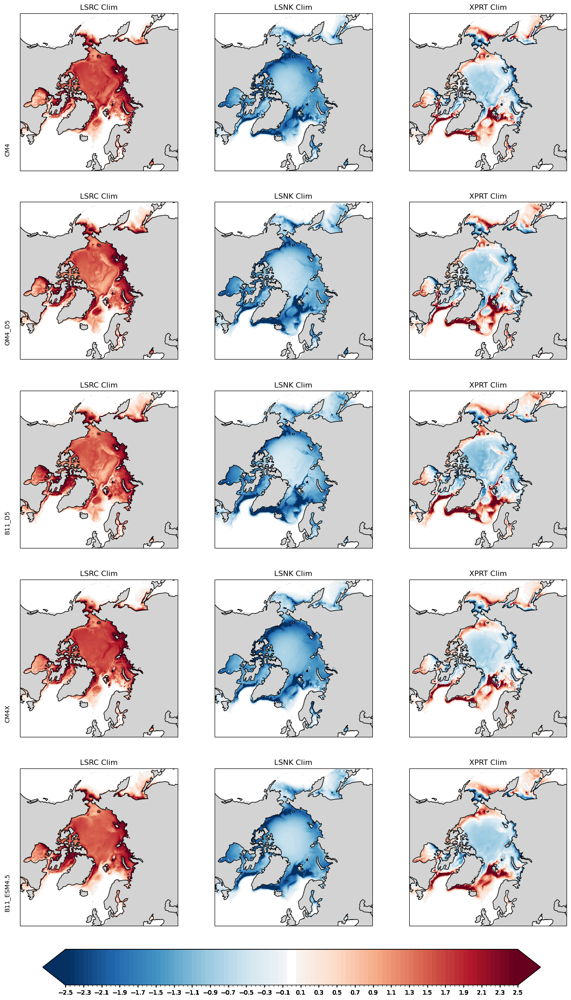

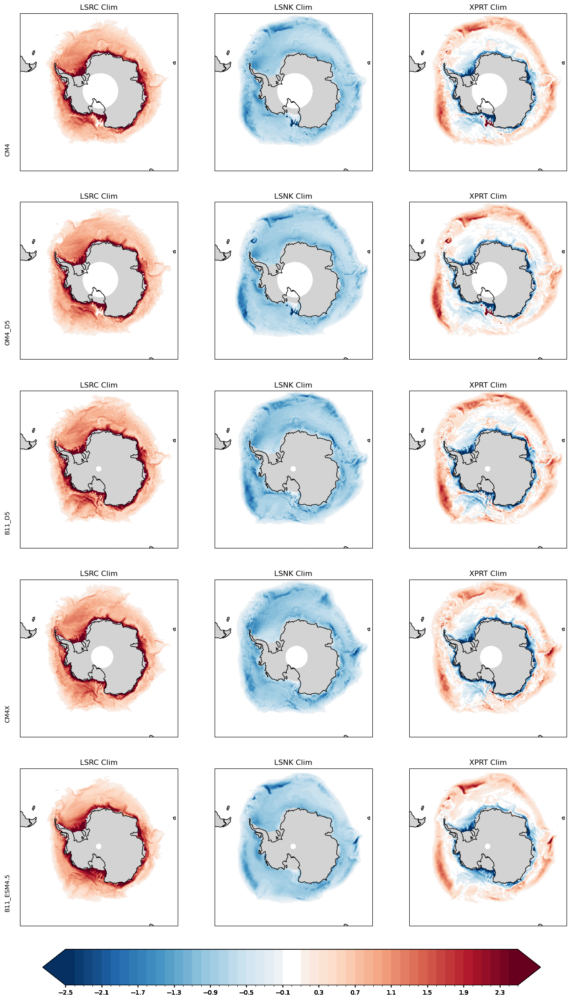

In [37]:
var_list=['LSRC','LSNK', 'XPRT']

rho_ice=905
scale_fact=1/rho_ice

M=2.5
c_lims_nh=np.array([
 [-M, M],
 [-M, M],
 [-M, M]])

fig, ax = plt.subplots(len(diag.groups),len(var_list),figsize=(16, 16*len(diag.groups)/len(var_list)),subplot_kw={'projection': ccrs.NorthPolarStereo()})

for j,var in enumerate(var_list):
    for k,group in enumerate(diag.groups):
            title_str=var+" Clim"
            text_str = group.name if j == 0 else ''
            make_polar_plot_nh(ax[k,j],si_dict[group.name][lonvar],si_dict[group.name][latvar],scale_fact*si_dict[group.name][var+'_clim_ann_mean'],
        6,6,40,c_lims_nh[j,0],c_lims_nh[j,1],0.05,title_str,text_str,1)
    all_figs.append(fig)

c_lims_sh=np.array([
 [-M, M],
 [-M, M],
 [-M, M]])

fig, ax = plt.subplots(len(diag.groups),len(var_list),figsize=(16, 16*len(diag.groups)/len(var_list)),subplot_kw={'projection': ccrs.SouthPolarStereo()})

for j,var in enumerate(var_list):
    for k,group in enumerate(diag.groups):
            title_str=var+" Clim"
            text_str = group.name if j == 0 else ''
            make_polar_plot_sh(ax[k,j],si_dict[group.name][lonvar],si_dict[group.name][latvar],scale_fact*si_dict[group.name][var+'_clim_ann_mean'],
        6,6,40,c_lims_nh[j,0],c_lims_nh[j,1],0.1,title_str,text_str,1)
    all_figs.append(fig)

## Save ppt of all figures

In [38]:
esnb.nbtools.save_pptx(all_figs, "sea_ice.pptx")

## Save metrics JSON file

In [39]:
diag.write_metrics("sea_ice.json")

{
  "DIMENSIONS": {
    "json_structure": [
      "region",
      "model",
      "metric"
    ]
  },
  "RESULTS": {
    "Global": {
      "CM4": {
        "SIE_clim_RMSE_NH": {
          "RMSE": 1.57559821750186
        },
        "SIA_clim_RMSE_NH": {
          "RMSE": 1.3935552063182952
        },
        "SIE_clim_RMSE_SH": {
          "RMSE": 4.454708307936705
        },
        "SIA_clim_RMSE_SH": {
          "RMSE": 4.0367490056331325
        },
        "SIE_std_RMSE_NH": {
          "RMSE": 0.06219912364794584
        },
        "SIE_lagged_corr_RMSE_NH": {
          "RMSE": 0.20340405678738357
        },
        "SIE_std_RMSE_SH": {
          "RMSE": 0.16489966782673665
        },
        "SIE_lagged_corr_RMSE_SH": {
          "RMSE": 0.15551367472883396
        },
        "SIV_clim_RMSE_NH": {
          "RMSE": 6.162147928684055
        },
        "SIV_std_RMSE_NH": {
          "RMSE": 0.18891888449661456
        },
        "SIV_lagged_corr_RMSE_NH": {
          "RMSE": 0.0616

In [40]:
print(RMS_tmp)

0.16904081522747433
